In [93]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.datasets import load_iris
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import DBSCAN

from scipy.stats import multivariate_normal

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn import metrics
from sklearn.metrics import silhouette_score

import scipy.cluster.hierarchy as shc

%matplotlib inline

## iris dataset

PCA

In [51]:
iris_data=load_iris()
iris_data.keys()
iris_df = pd.DataFrame(iris_data['data'],columns=iris_data['feature_names'])
scaling=StandardScaler()
scaling.fit(iris_df)
Scaled_data=scaling.transform(iris_df)
principal=PCA(n_components=3)
principal.fit(Scaled_data)
Iris_Data_PCA=principal.transform(Scaled_data)
Iris_Data_PCA = pd.DataFrame(Iris_Data_PCA)

KMEAN

Best K = 2 score= 0.5859517912768418


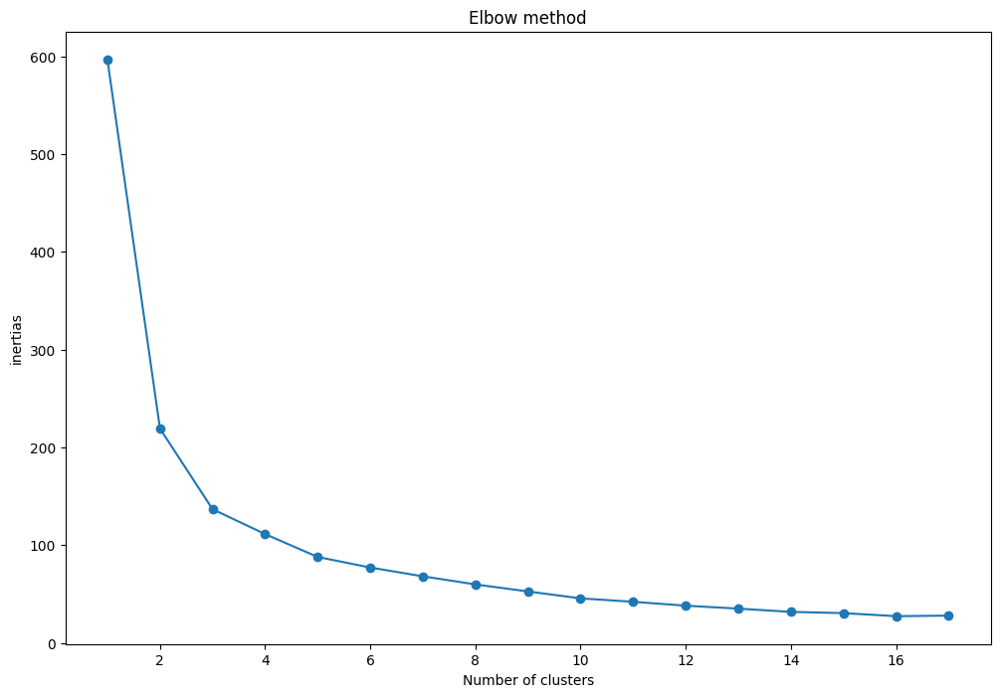

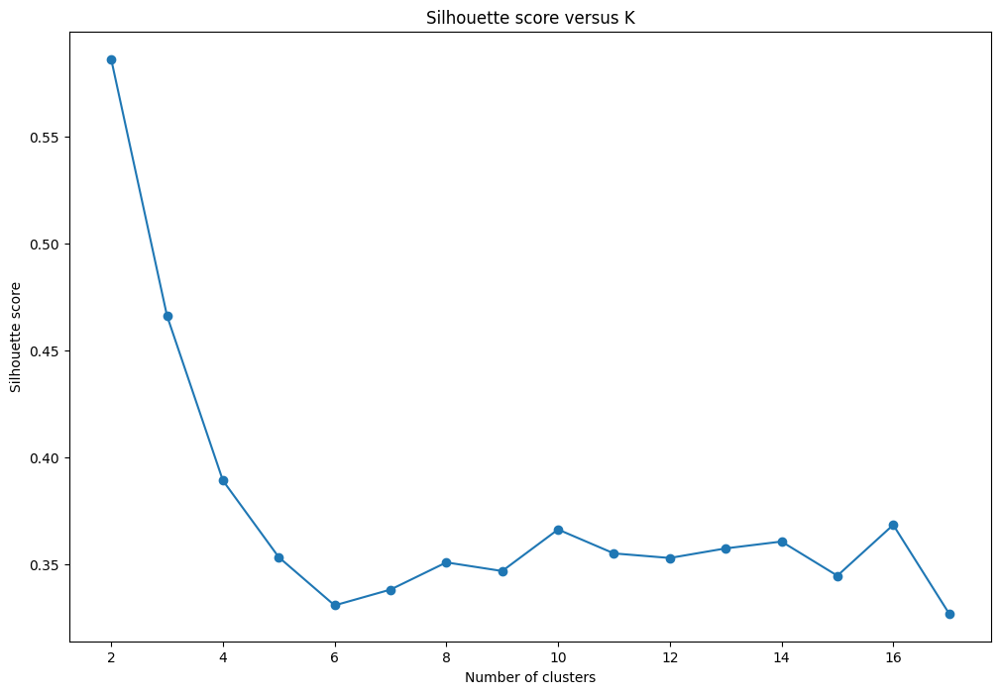

<Figure size 1200x800 with 0 Axes>

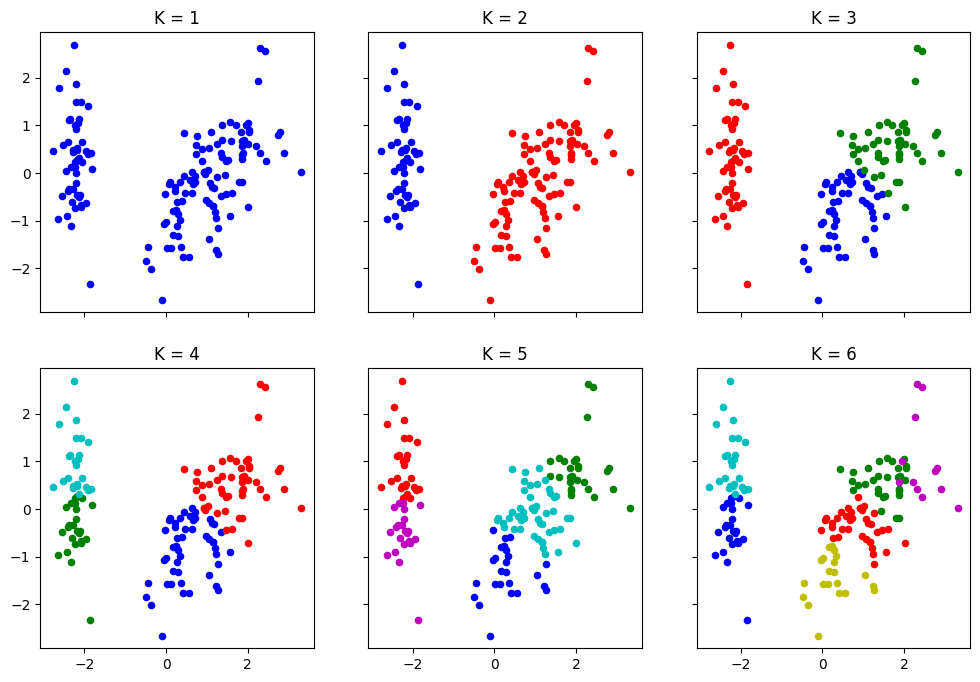

In [52]:
def display_cluster(axes,k,z,labels,X,km=[],num_clusters=0):
    color = 'brgcmyk'
    alpha = 1
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            axes[k][z].scatter(X[labels==i][0],X[labels==i][1],c = color[i],alpha = alpha,s=s)
            axes[k][z].title.set_text('K = '+str(i+1))

kmeans=[]
inertias=[]
score=[]
labels = []

k=0
z=0

for j in range(1,18):
    
    kmeans.append(KMeans(n_clusters=j,init = 'k-means++',   max_iter = 100, n_init = 10, random_state = 0))
    kmeans[j-1]=kmeans[j-1].fit(Iris_Data_PCA)
    inertias.append(kmeans[j-1].inertia_)
    labels.append(kmeans[j-1].predict(Iris_Data_PCA))
    if(j>1 and j<18):
        score.append(silhouette_score(Iris_Data_PCA, kmeans[j-1].labels_, metric='euclidean'))
        
Best_score=max(score)
K_of_Best_score=2+score.index(Best_score)

plt.figure(1)       
plt.plot(range(1,18), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('inertias')

plt.figure(2)       
plt.plot(range(2,18), score, marker='o')
plt.title('Silhouette score versus K')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')

f = plt.figure(3)    
f, axes = plt.subplots(nrows = 2, ncols = 3, sharex=True, sharey = True)
plt.rcParams['figure.figsize'] = [12, 8]

for j in range(1,7):
    
    display_cluster(axes,k,z,labels[j-1],Iris_Data_PCA,kmeans[j-1],num_clusters=j)
    
    if j == 3:
        k=k+1
        z=0
    else:
        z=z+1
        

print('Best K = '+str(K_of_Best_score)+' score= '+str(Best_score))

AgglomerativeClustering

cosine average clusters=2 score= 0.7348839720527012 With distance thresholed = 0.9400000000000002


<Figure size 1200x800 with 0 Axes>

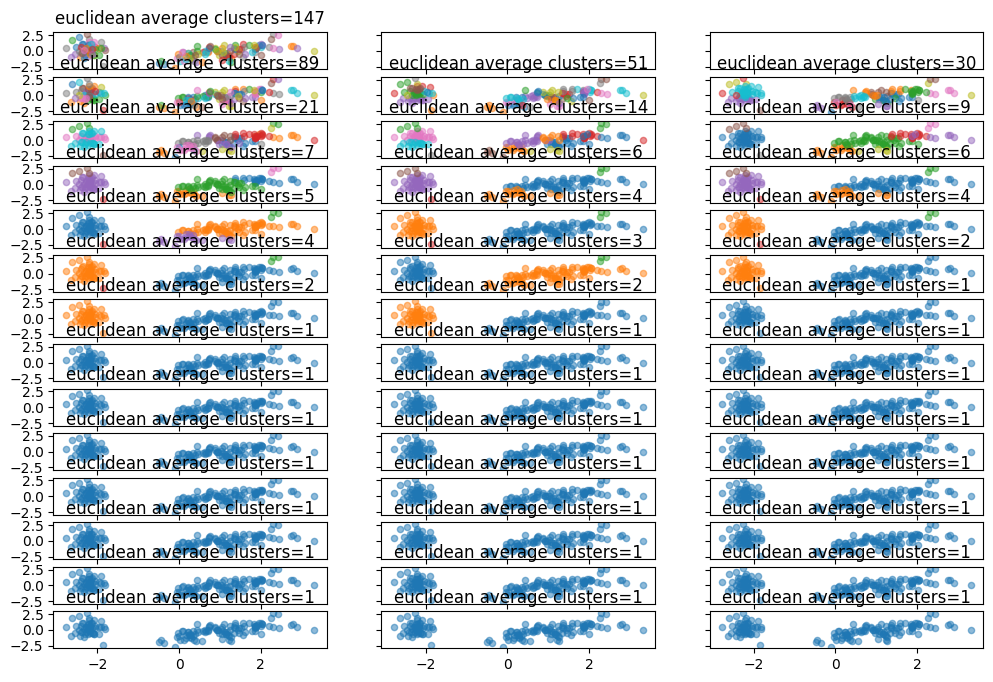

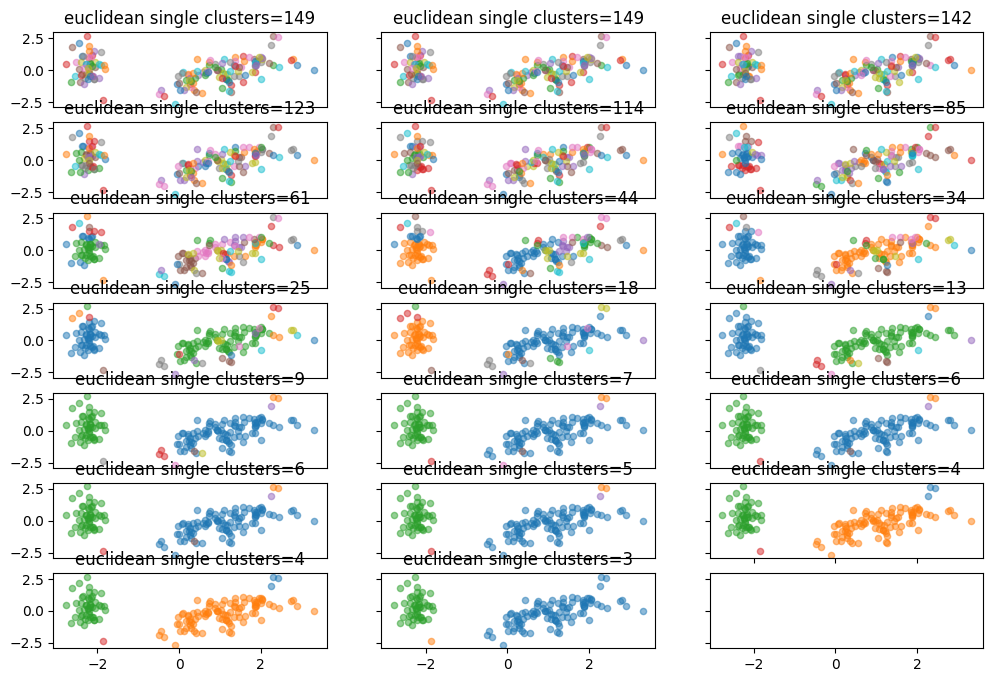

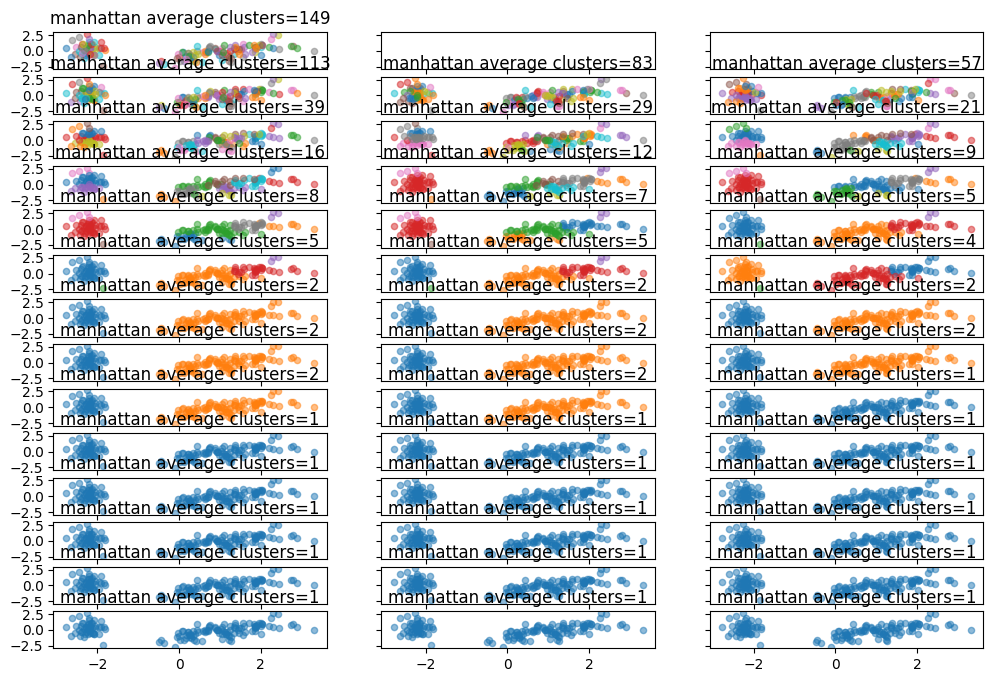

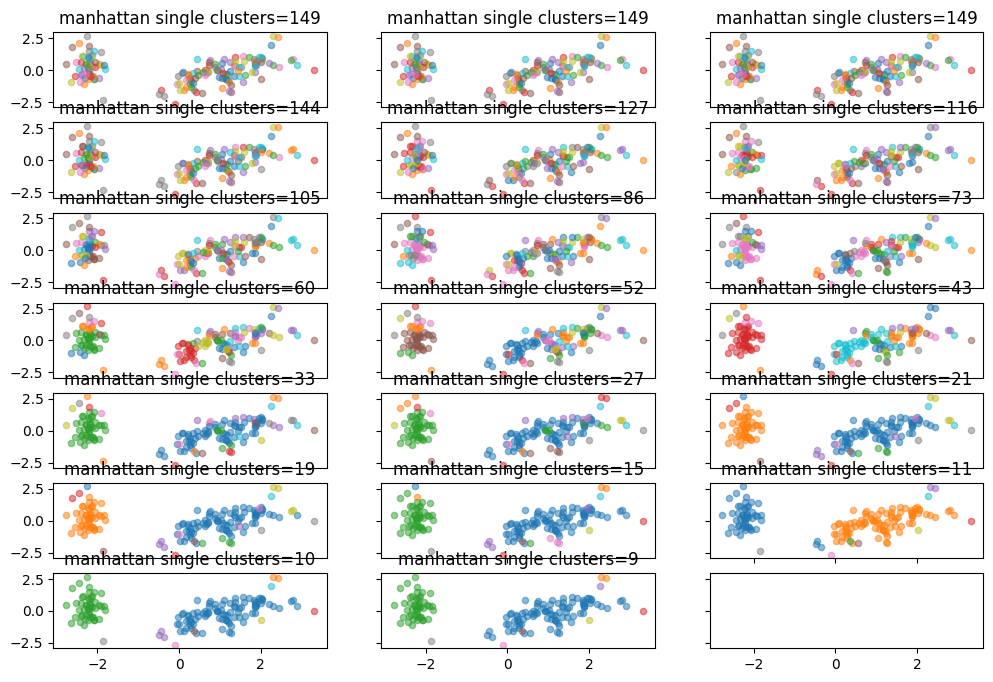

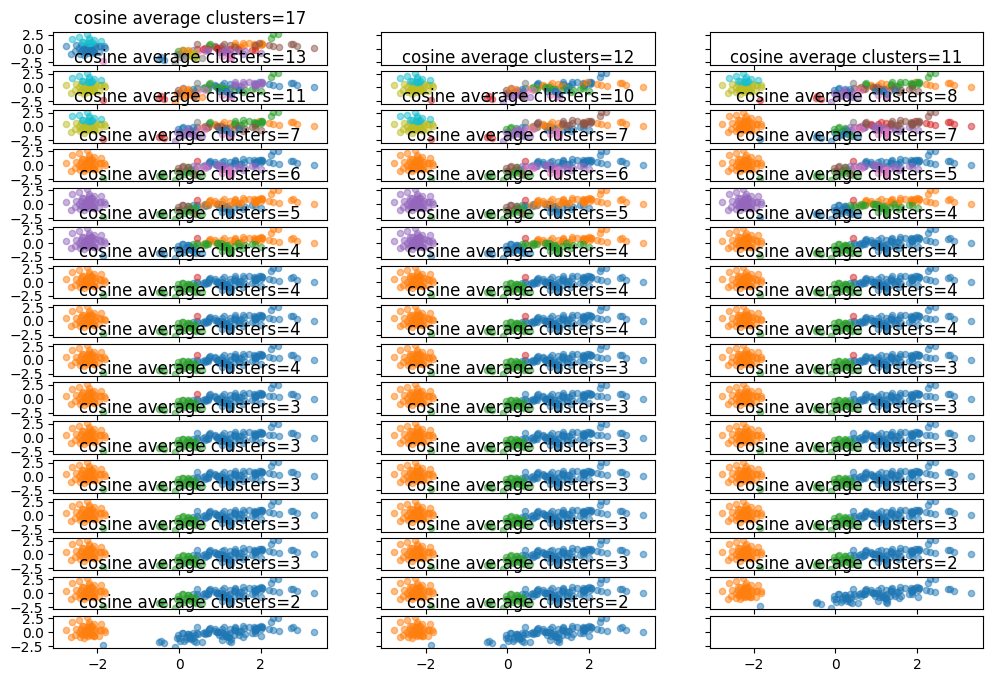

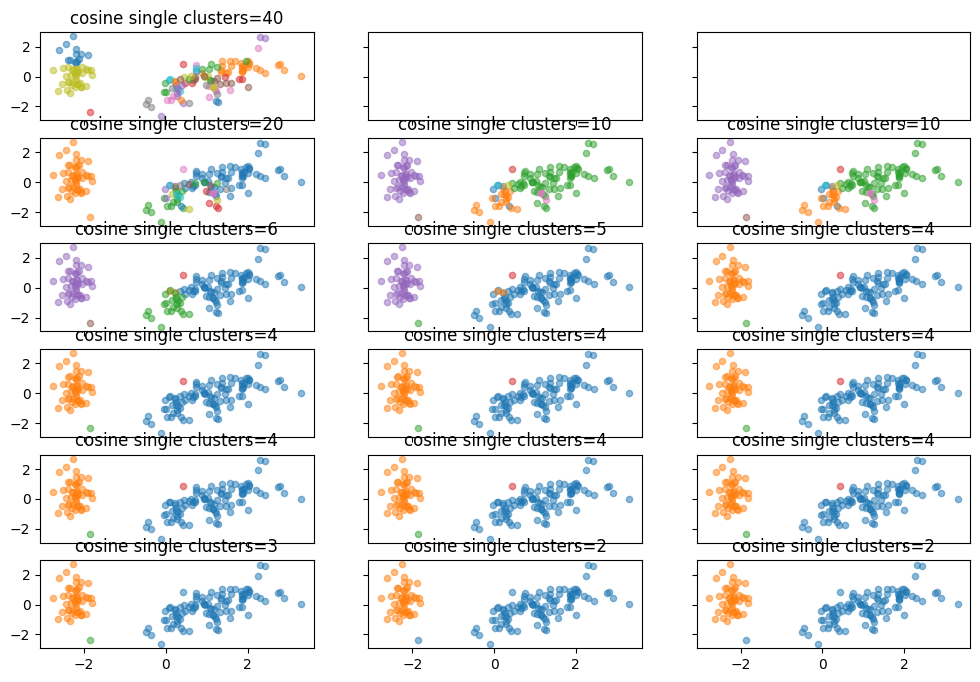

In [80]:
def display_cluster(axes,k,z,parameter,X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            axes[k][z].scatter(X[km.labels_==i][0],X[km.labels_==i][1],cmap = 'plasma',alpha = alpha,s=s)
            axes[k][z].title.set_text(parameter)
            plt.rcParams['figure.figsize'] = [12, 8]

hc=[]
score=[]
parameters=[]
score_parameters=[]
clusters=[]
dist=[]
j=0
t=0
n=0
xx=0
range_d=[]
cosine_dist=np.arange(0.1, 1,0.02);
ecl_manh_dist=np.arange(0.1, 8.1,0.2);
cosi_single_dist=np.arange(0.01, 0.1,0.006);
man_ecl_single_dist=np.arange(0.01, 1,0.05);
for aff in ['euclidean','manhattan','cosine']:
    for link in ['average','single']:
        z=0
        k=0
        j=j+1
        
        if(aff=='cosine'):
            if(link=='average'):
                range_d=cosine_dist
                xx=16
            else:
                range_d=cosi_single_dist
                xx=6
                
        else:
            if(link=='average'):
                range_d=ecl_manh_dist
                xx=14
            else:
                range_d=man_ecl_single_dist
                xx=7
                
            
        f = plt.figure(j)    
        f, axes = plt.subplots(nrows = xx, ncols = 3, sharex=True, sharey = True)
        for i in range_d:
            hc.append(AgglomerativeClustering(distance_threshold=i,affinity=aff,linkage=link,n_clusters=None))
            hc[t]=hc[t].fit(Iris_Data_PCA)
            clusters.append(hc[t].n_clusters_)
            parameters.append(aff+' '+link+' clusters='+str(clusters[t]))
            display_cluster(axes,k,z,parameters[len(parameters)-1],Iris_Data_PCA,hc[t],num_clusters=clusters[t])
            if(hc[t].n_clusters_>1):
                dist.append(i)
                score.append(silhouette_score(Iris_Data_PCA, hc[t].labels_, metric=aff))
                score_parameters.append(parameters[len(parameters)-1])
            
            t=t+1
            
            if n % 3==0:
                k=k+1
                z=0
            else:
                z=z+1
            n=n+1
Best_score=max(score)
Best_dist=dist[score.index(Best_score)]
Best_score_parameter=score_parameters[score.index(Best_score)]
print(Best_score_parameter+' score= '+str(Best_score)+' With distance thresholed = '+str(Best_dist))

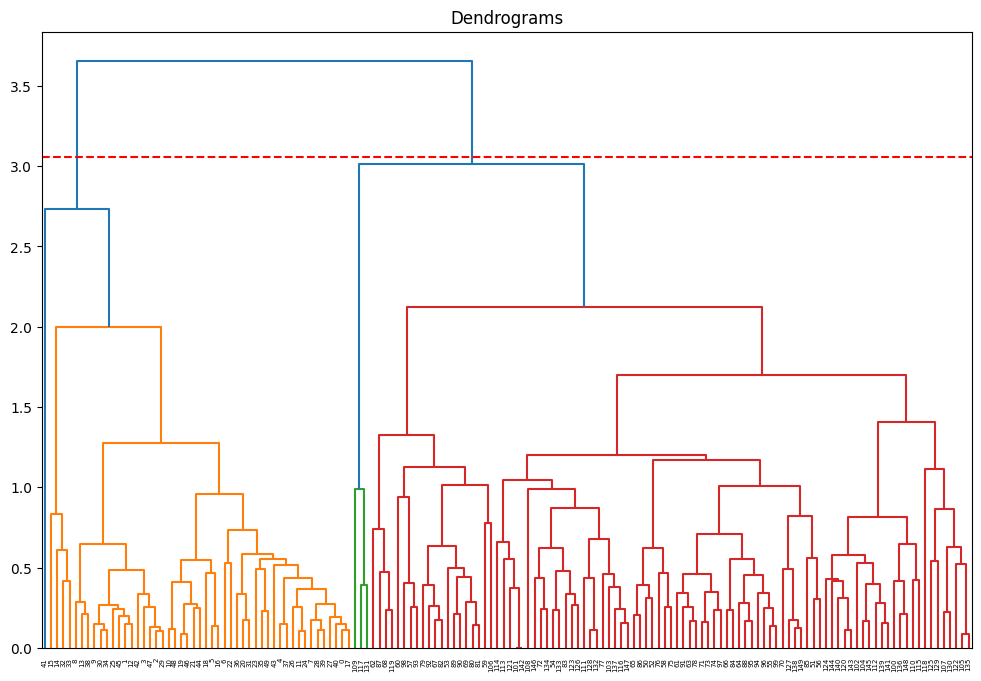

In [83]:
plt.rcParams['figure.figsize'] = [12, 8]  
plt.title("Dendrograms")
dendrogram_av = shc.dendrogram(shc.linkage( Iris_Data_PCA, method='average'))
plt.axhline(y=4-Best_dist, color='r', linestyle='--')

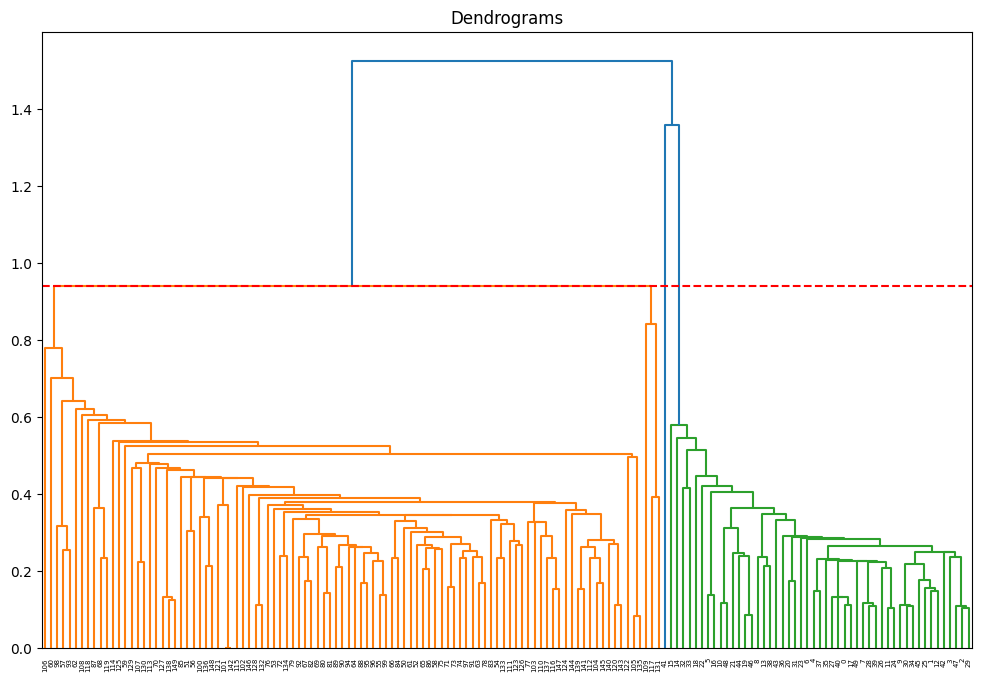

In [84]:
plt.rcParams['figure.figsize'] = [12, 8]  
plt.title("Dendrograms")
dendrogram_si = shc.dendrogram(shc.linkage( Iris_Data_PCA, method='single'))
plt.axhline(y=Best_dist, color='r', linestyle='--')

DBSCAN

Epsilon = 1.4000000000000001 Min_samples = 5 Score= 0.5859517912768418


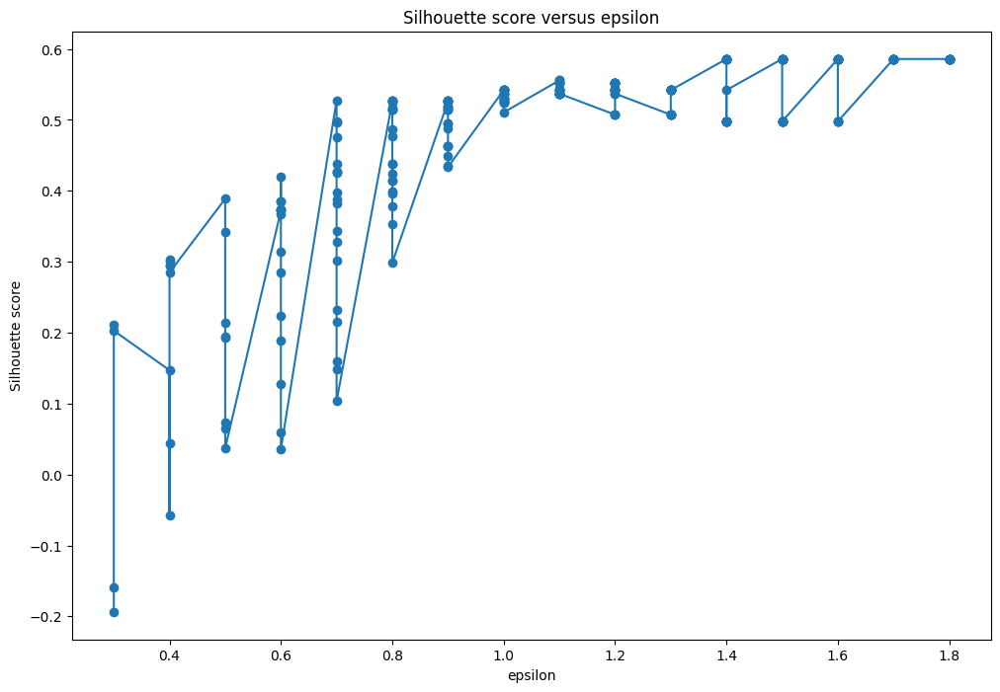

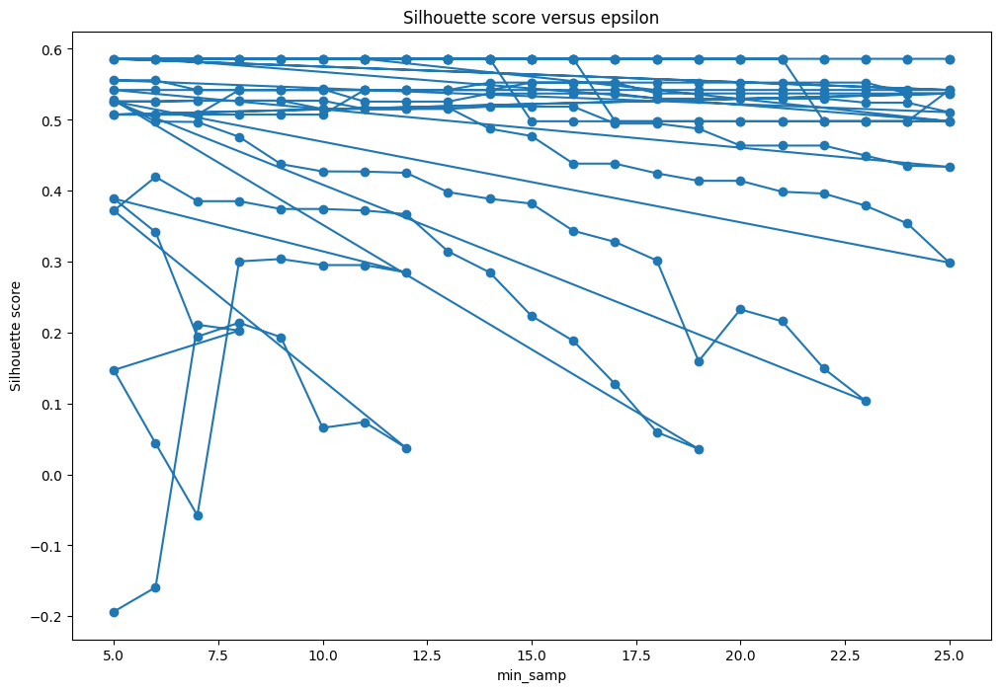

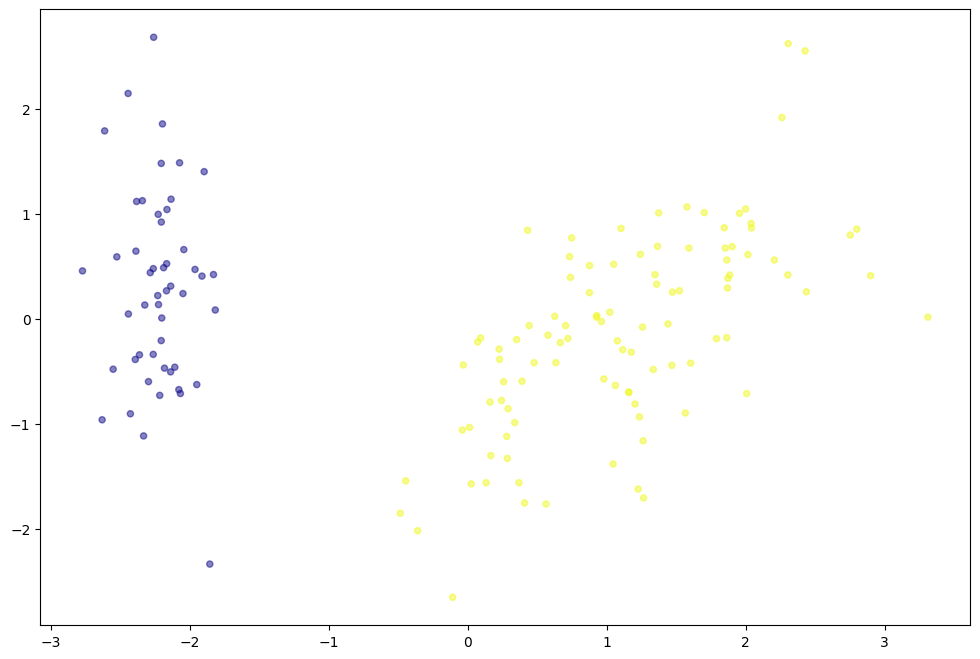

In [87]:
def display_cluster(X,km=[]):
    plt.scatter(X[:, 0], X[:,1], c = km.labels_, cmap= "plasma",alpha = 0.5,s = 20)
            
score=[]
epsilon=[]
clusters=[]
min_samp=[]

for e in np.arange(0.1, 3.1, 0.1):
    for mini in range(5,26):
        dbscan = DBSCAN(eps =e, min_samples = mini)
        dbscan=dbscan.fit(Iris_Data_PCA)
        Number_of_clusters=len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
        if Number_of_clusters > 1:
            epsilon.append(e)
            clusters.append(Number_of_clusters)
            min_samp.append(mini)
            score.append(metrics.silhouette_score(Iris_Data_PCA, dbscan.labels_))
            
plt.figure(1)  
plt.rcParams['figure.figsize'] = [12, 8]     
plt.plot(epsilon, score, marker='o')
plt.title('Silhouette score versus epsilon')
plt.xlabel('epsilon')
plt.ylabel('Silhouette score')

plt.figure(2)       
plt.plot(min_samp, score, marker='o')
plt.title('Silhouette score versus epsilon')
plt.xlabel('min_samp')
plt.ylabel('Silhouette score')

plt.figure(3) 

best_score=max(score)
g=score.index(best_score)
display_cluster(Iris_Data_PCA.to_numpy(),DBSCAN(eps =epsilon[g], min_samples = min_samp[g]).fit(Iris_Data_PCA))
Best_score_parameters='Epsilon = '+str(epsilon[g])+' Min_samples = '+str(min_samp[g])
print(Best_score_parameters+' Score= '+str(best_score))

GMM

<Figure size 1200x800 with 0 Axes>

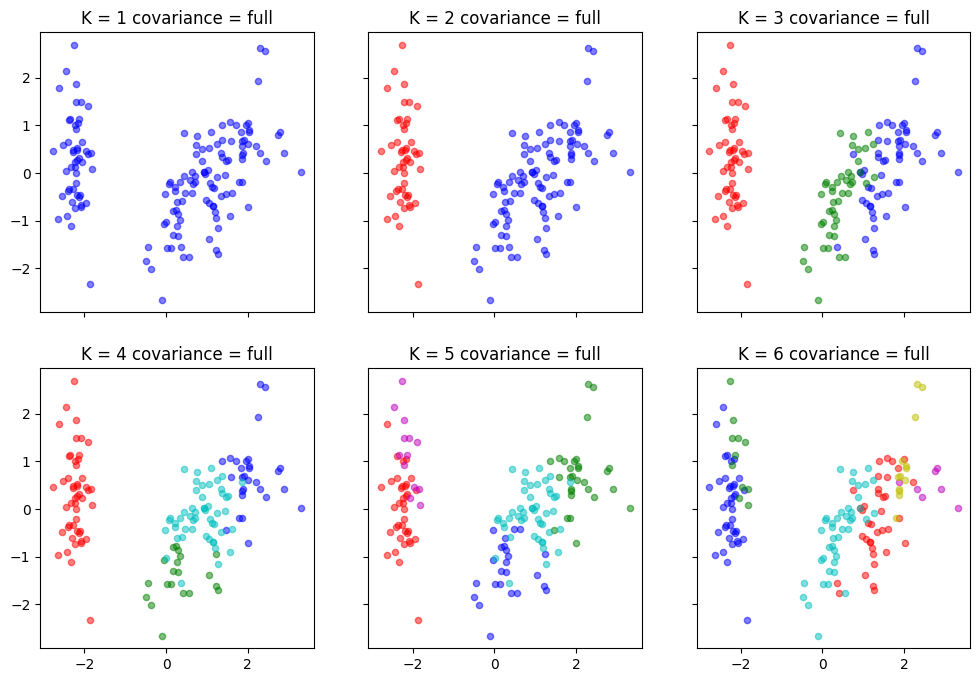

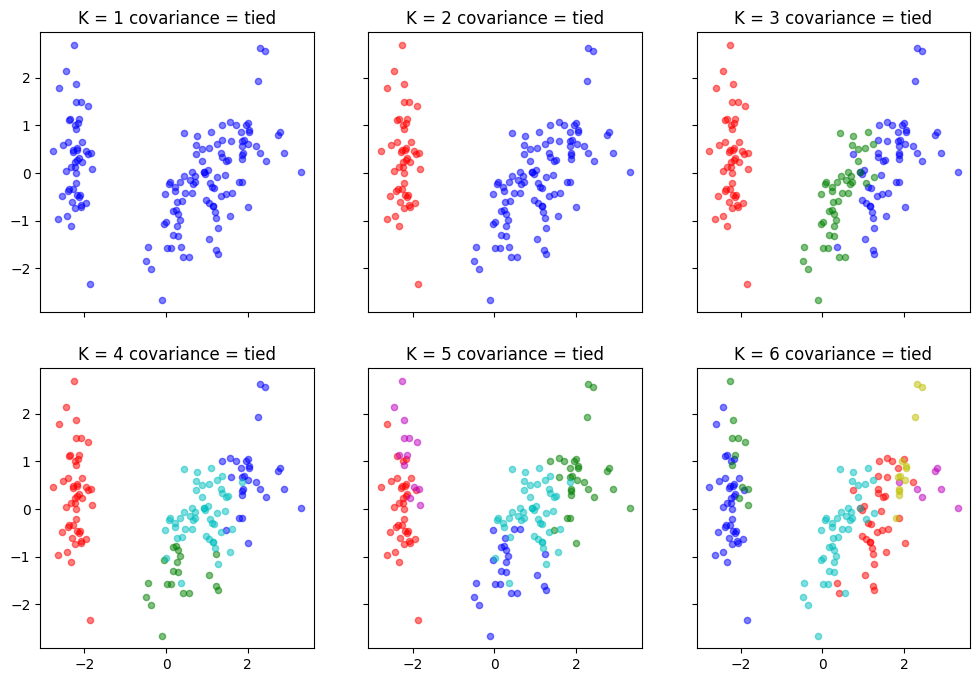

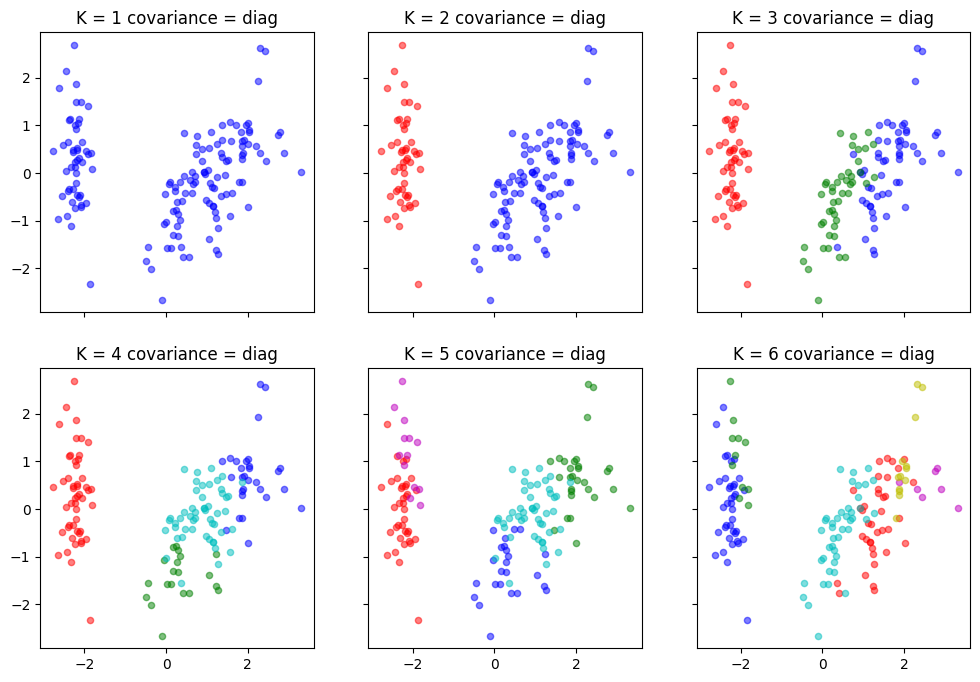

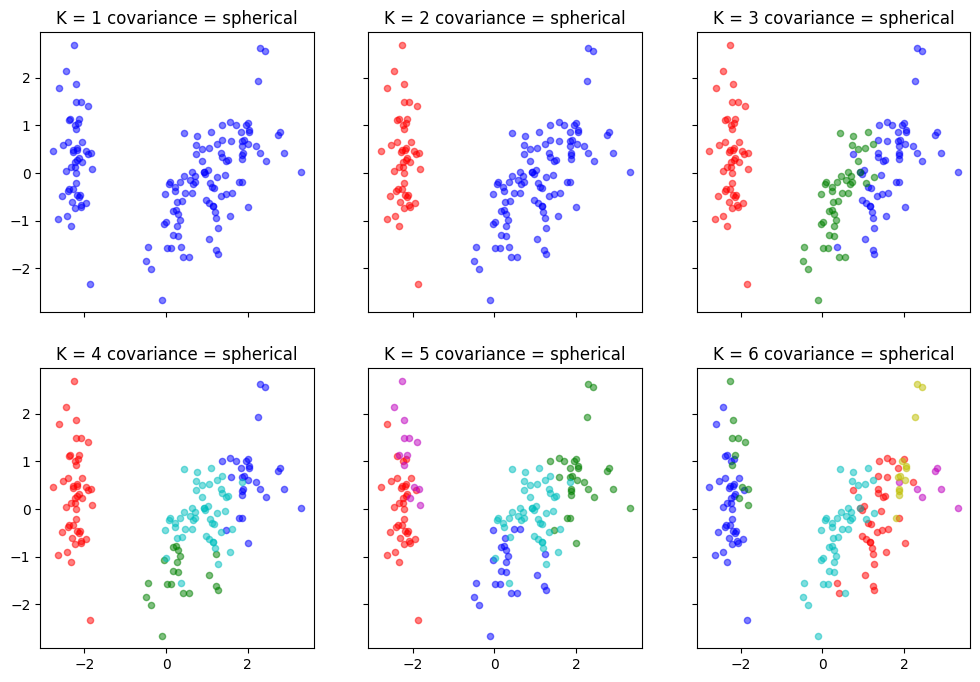

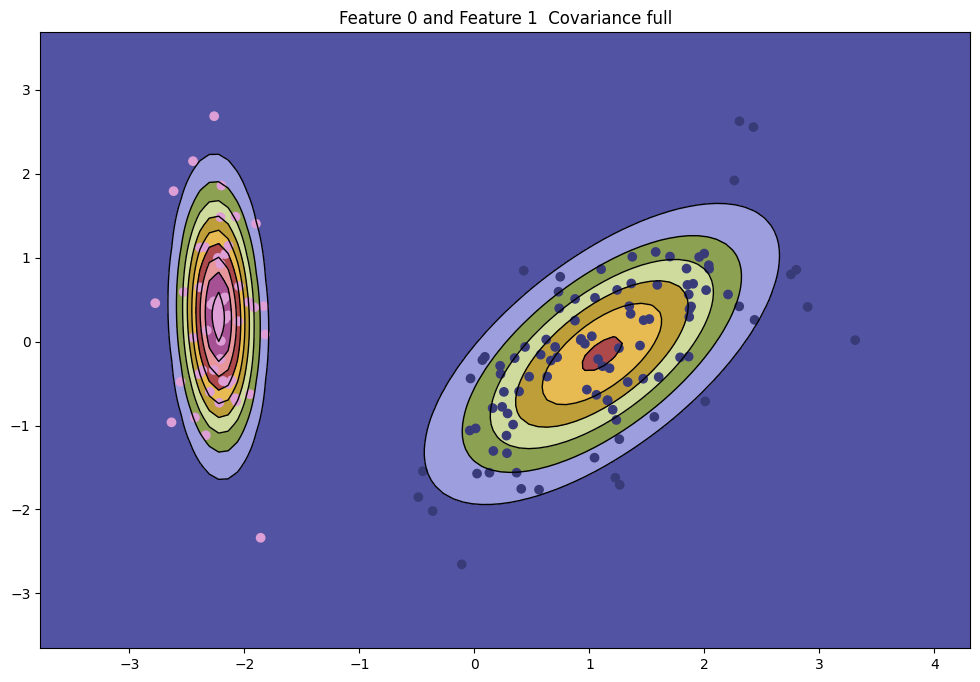

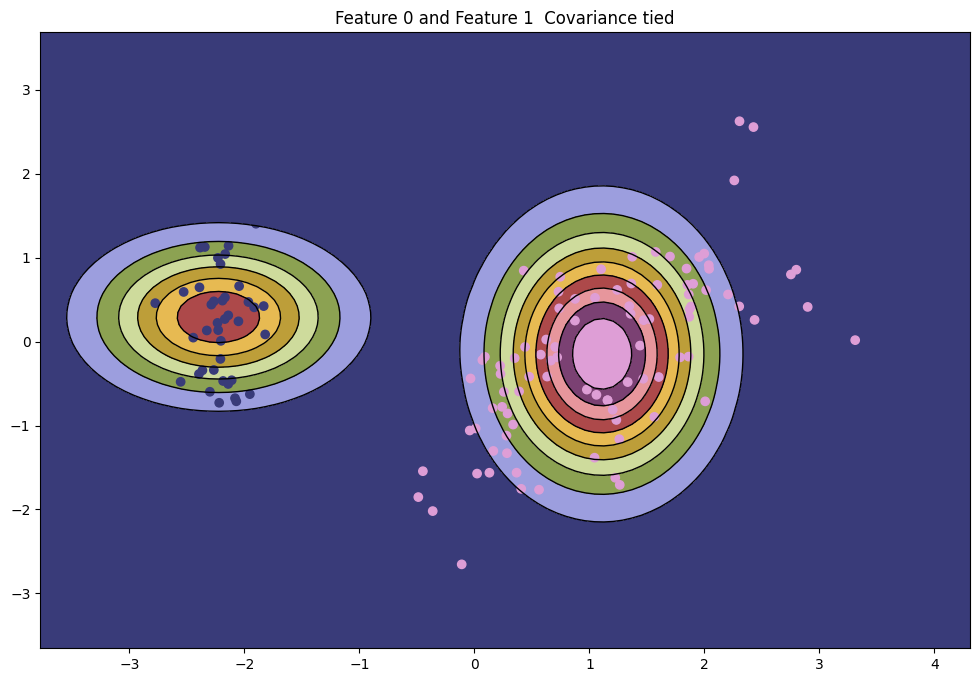

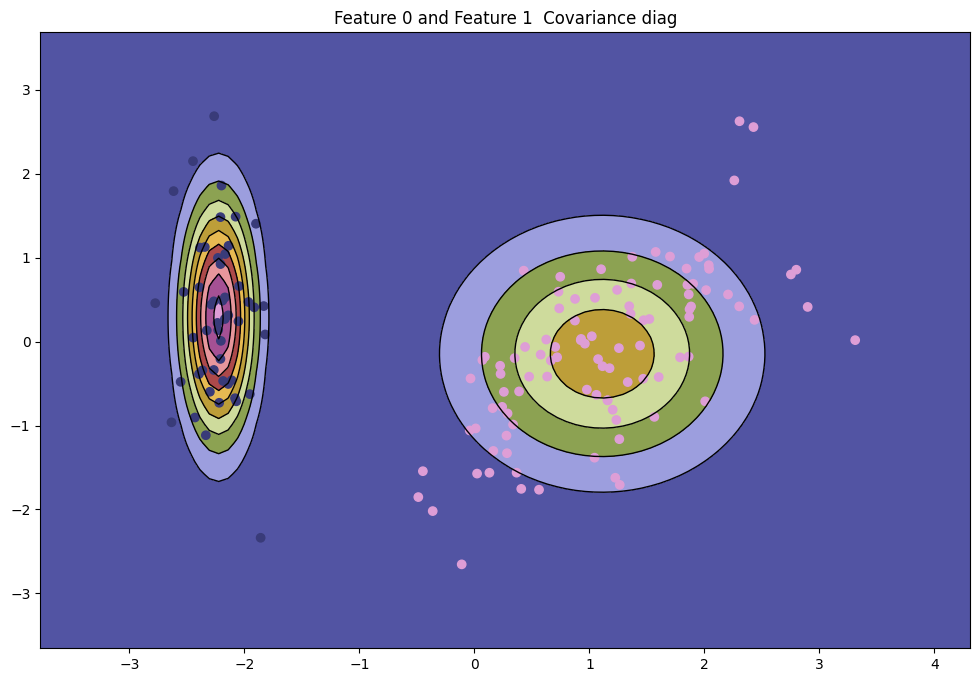

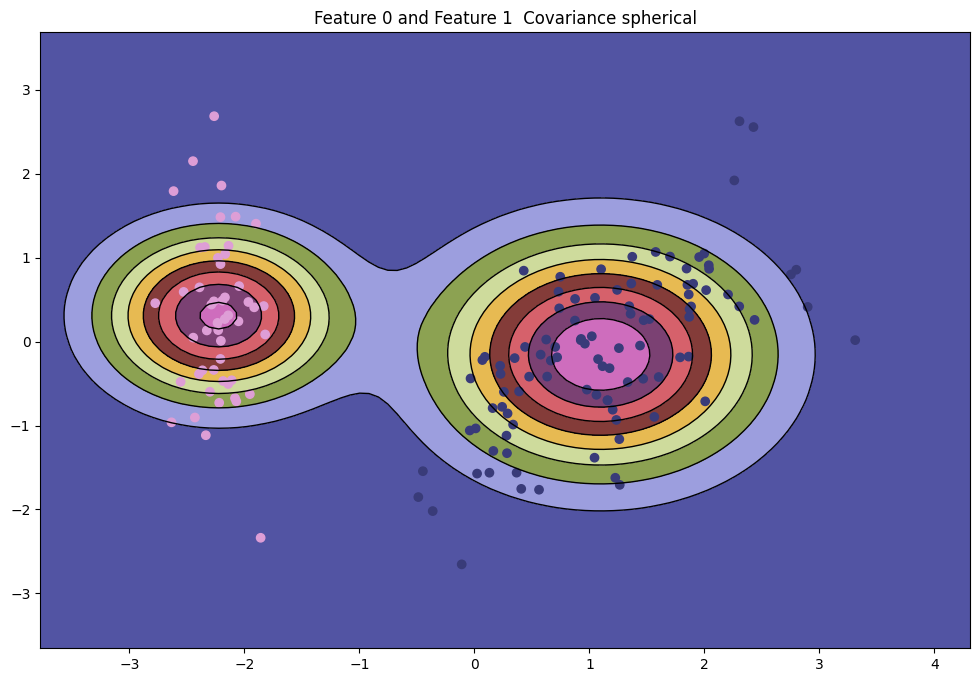

In [153]:
def plot_contours():
    covariance =['full', 'tied', 'diag', 'spherical']
    h=0
    for q in range(0,4):

        Iris_Data_PCA_2=Iris_Data_PCA.iloc[:,[0,1]].values
        gmm=GaussianMixture(n_components = 2,covariance_type=covariance[q])
        gmm=gmm.fit(Iris_Data_PCA_2)

        plt.figure(h+5)
        x_min, x_max = Iris_Data_PCA_2[:, 0].min() - 1, Iris_Data_PCA_2[:, 0].max() + 1
        y_min, y_max = Iris_Data_PCA_2[:, 1].min() - 1, Iris_Data_PCA_2[:, 1].max() + 1
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        Z = np.zeros((xx.shape[0], xx.shape[1]))
        for i in range(gmm.n_components):
            density = multivariate_normal(mean=gmm.means_[i], cov=gmm.covariances_[i]).pdf(np.dstack((xx, yy)))
            Z += density * gmm.weights_[i]

        plt.contour(xx, yy, Z, levels=10, linewidths=1, colors='black')
        plt.contourf(xx, yy, Z, levels=10, cmap='tab20b')
        plt.scatter(Iris_Data_PCA_2[:, 0], Iris_Data_PCA_2[:, 1], c=gmm.predict(Iris_Data_PCA_2), cmap='tab20b')
        plt.title('Feature 0 and Feature 1 '+' Covariance '+covariance[q])
        plt.show()
        h=h+1

def display_cluster(axes,k,z,covariance,labels,X,km=[],num_clusters=0):
    color = 'brgcmyk'
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            axes[k][z].scatter(X[labels==i][0], X[labels==i][1],c = color[i],alpha = alpha,s=s)
            axes[k][z].title.set_text('K = '+str(i+1)+' covariance = '+covariance)

            
covariance =['full', 'tied', 'diag', 'spherical']
labels = []
gmm=[]
for q in range(0,4):

    for j in range(1,18):

        gmm.append(GaussianMixture(n_components = j,covariance_type=covariance[q]))
        gmm[j-1]=gmm[j-1].fit(Iris_Data_PCA)
        labels.append(gmm[j-1].predict(Iris_Data_PCA))

    k=0
    z=0

    f = plt.figure(q)
    f, axes = plt.subplots(nrows = 2, ncols = 3, sharex=True, sharey = True)
    plt.rcParams['figure.figsize'] = [12, 8]

    for j in range(1,7):

        display_cluster(axes,k,z,covariance[q],labels[j-1],Iris_Data_PCA,gmm[j-1],num_clusters=j)

        if j == 3:
            k=k+1
            z=0
        else:
            z=z+1
        

    k=0
    z=0
plot_contours()

## Customer Dataset

PCA

In [104]:
df_data= pd.read_csv('Customer data.csv', index_col = 0)
df_data.keys()
scaling=StandardScaler()
scaling.fit(df_data)
Scaled_data=scaling.transform(df_data)
principal=PCA(n_components=7)
principal.fit(Scaled_data)
Customer_Data_PCA=principal.transform(Scaled_data)

Customer_Data_PCA = pd.DataFrame(Customer_Data_PCA) #creating dataframe

KMEAN

Best K = 16 score= 0.35221929855350653


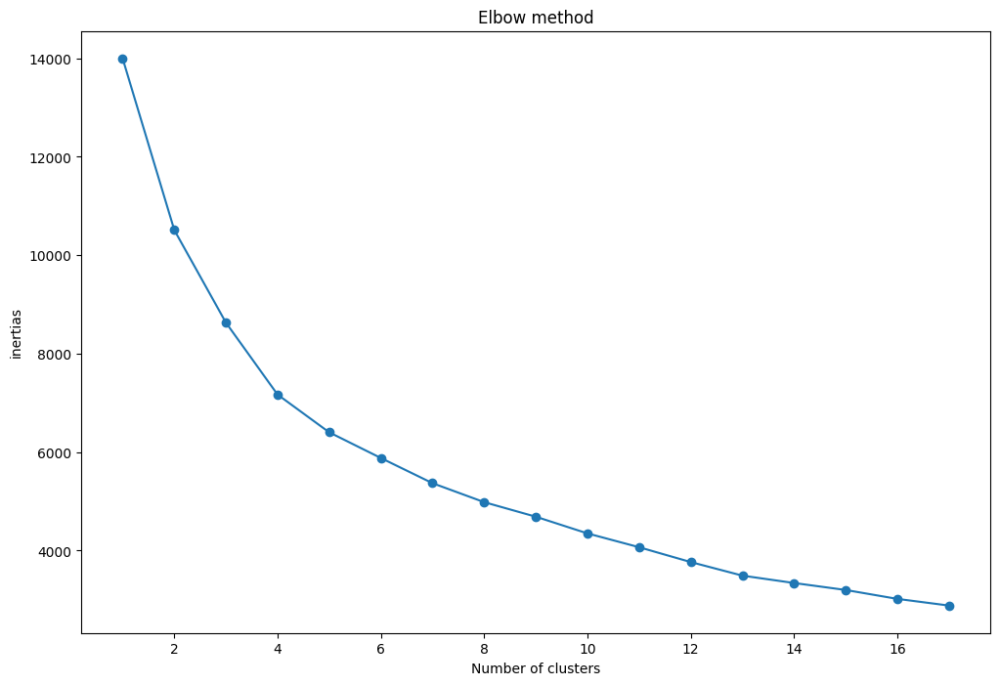

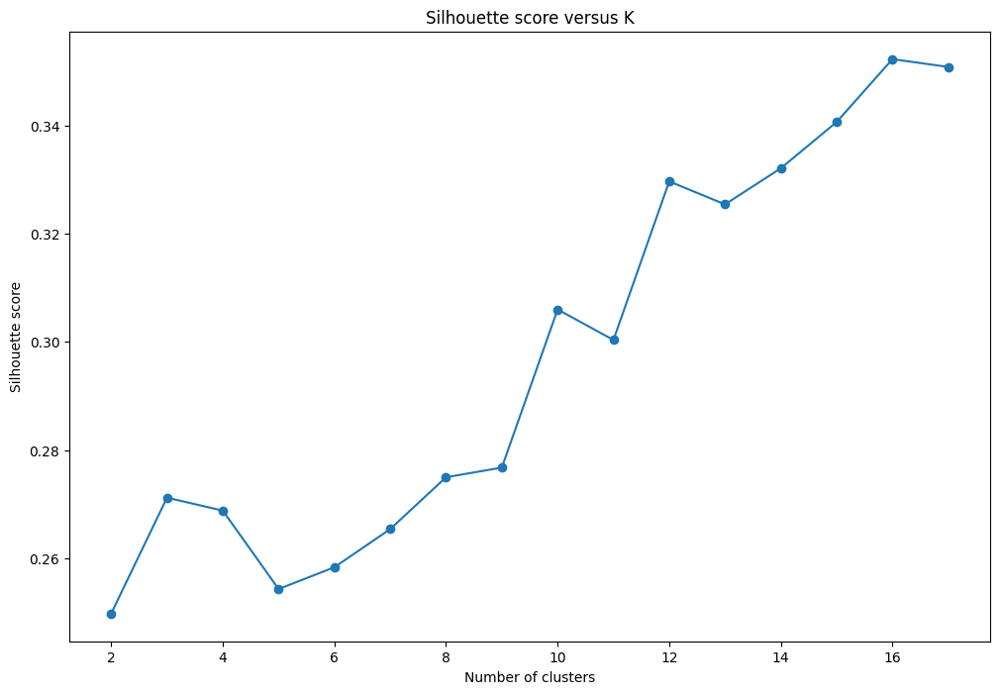

<Figure size 1200x800 with 0 Axes>

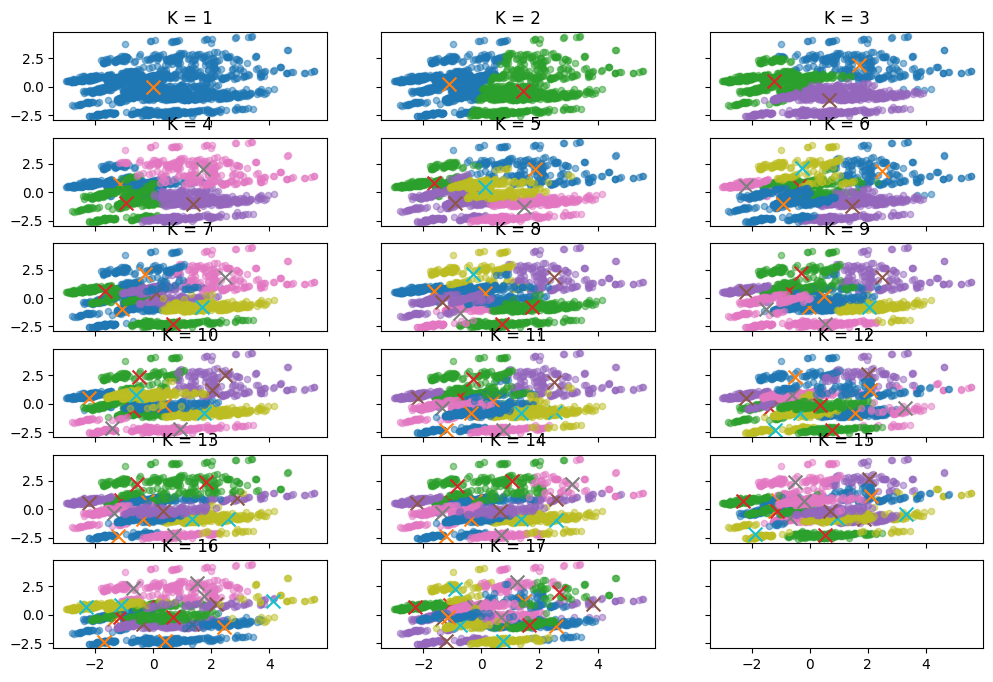

In [118]:
def display_cluster(axes,k,z,labels,X,km=[],num_clusters=0):
    color = 'brgcmyk'
    alpha = 0.5
    s = 20
    y=[0,1,2,3,4,5,6]
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            axes[k][z].scatter(X[labels==i][0],X[labels==i][1],cmap = 'plasma',alpha = alpha,s=s)
            axes[k][z].scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],cmap = 'plasma', marker = 'x', s = 100)
            axes[k][z].title.set_text('K = '+str(i+1))

kmeans=[]
inertias=[]
score=[]
labels = []


for j in range(1,18):
    
    kmeans.append(KMeans(n_clusters=j,init = 'k-means++',   max_iter = 100, n_init = 10, random_state = 0))
    kmeans[j-1]=kmeans[j-1].fit(Customer_Data_PCA)
    inertias.append(kmeans[j-1].inertia_)
    labels.append(kmeans[j-1].predict(Customer_Data_PCA))
    if(j>1 and j<18):
        score.append(silhouette_score(Customer_Data_PCA, kmeans[j-1].labels_, metric='euclidean'))
        
Best_score=max(score)
K_of_Best_score=2+score.index(Best_score)

plt.figure(1)       
plt.plot(range(1,18), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('inertias')

plt.figure(2)       
plt.plot(range(2,18), score, marker='o')
plt.title('Silhouette score versus K')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')


f = plt.figure(3)    
f, axes = plt.subplots(nrows = 6, ncols = 3, sharex=True, sharey = True)
plt.rcParams['figure.figsize'] = [12, 8]
k=0
z=0
for j in range(1,18):


    display_cluster(axes,k,z,labels[j-1],Customer_Data_PCA,kmeans[j-1],num_clusters=j)


    if j % 3==0:
        k=k+1
        z=0
    else:
        z=z+1

        

print('Best K = '+str(K_of_Best_score)+' score= '+str(Best_score))

AgglomerativeClustering

cosine average clusters=57 score= 0.5871635030805429 With distance thresholed = 0.2


<Figure size 1200x800 with 0 Axes>

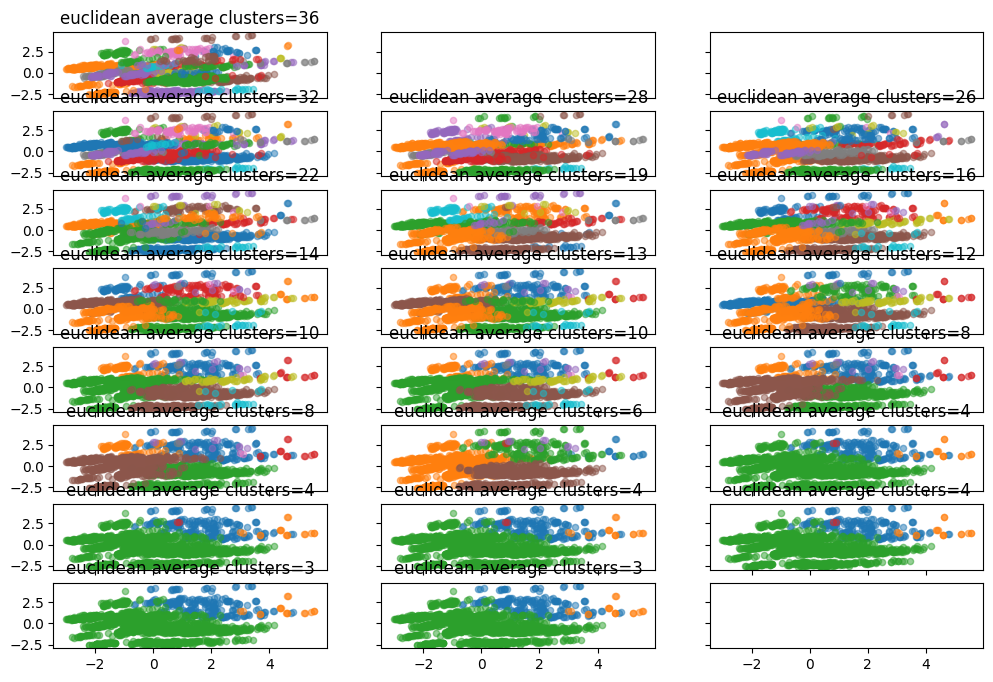

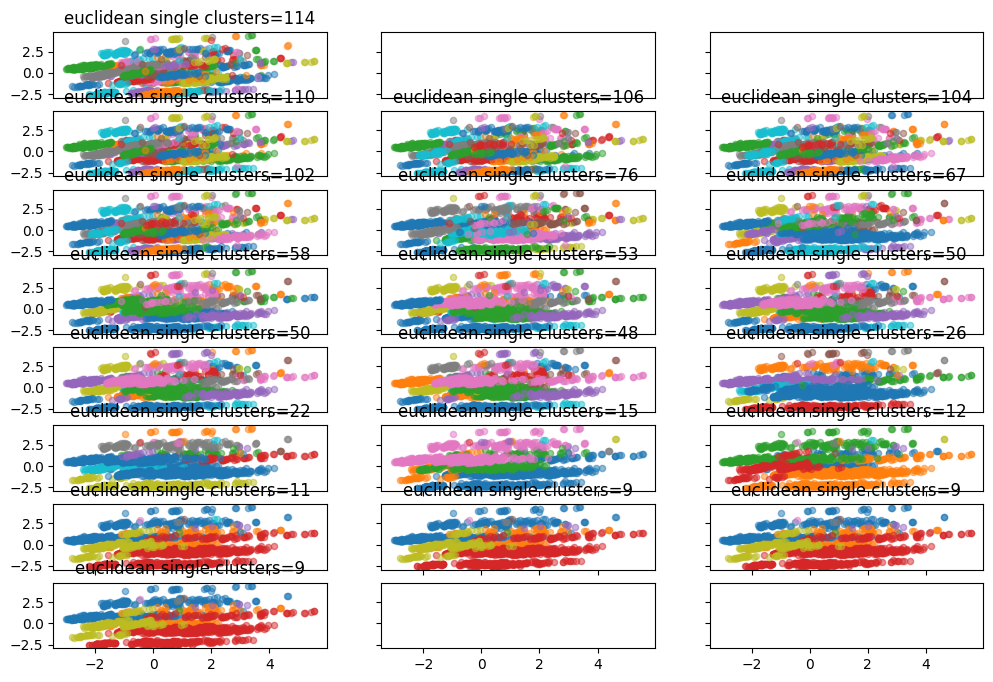

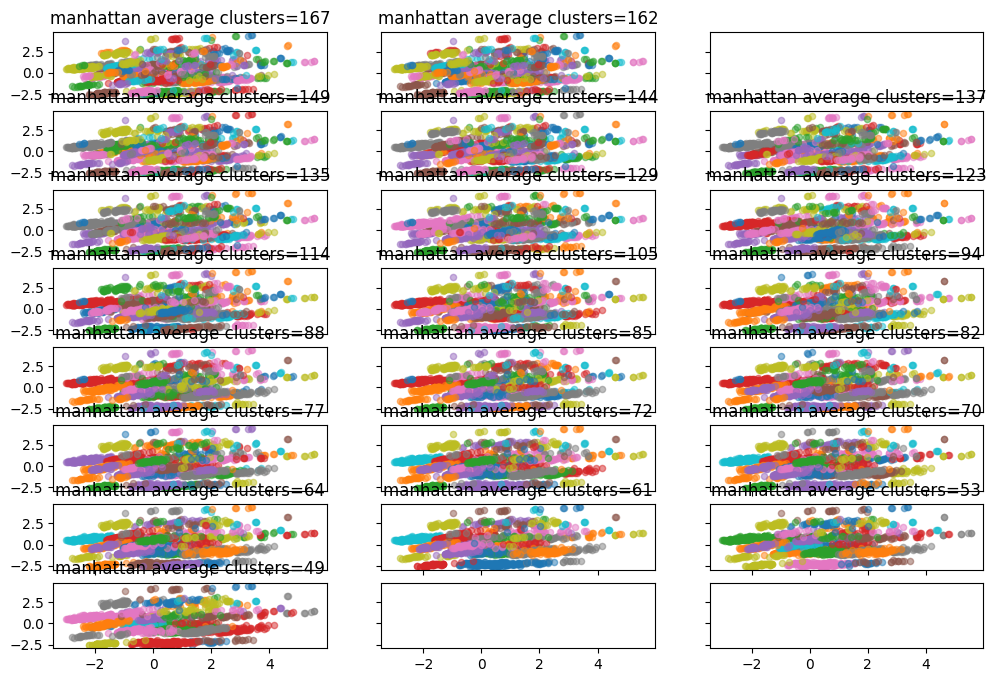

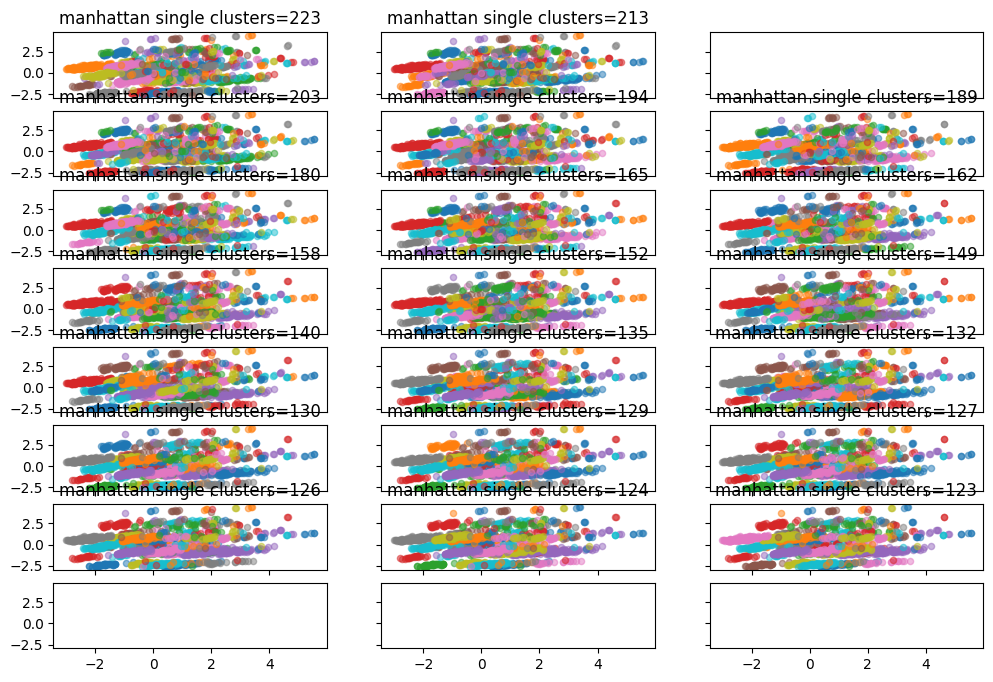

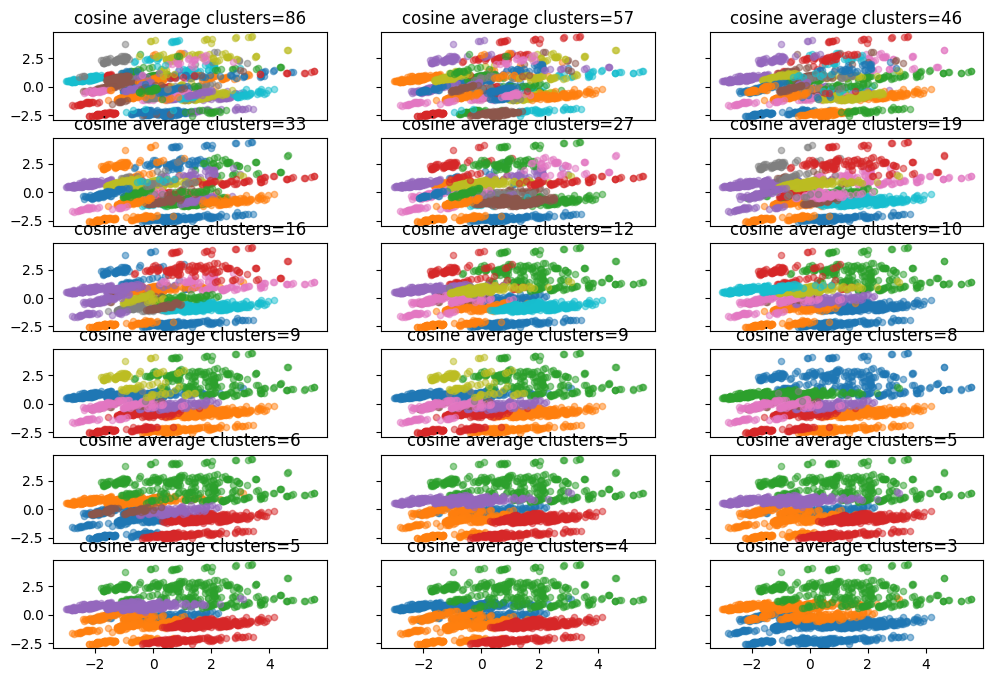

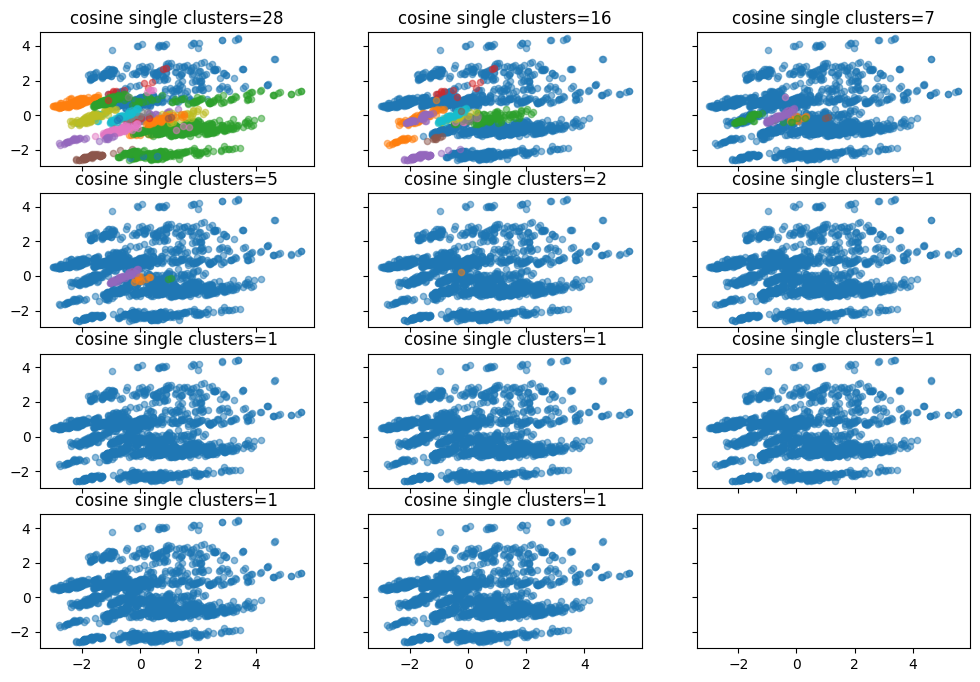

In [143]:
def display_cluster(axes,k,z,parameter,X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            axes[k][z].scatter(X[km.labels_==i][0],X[km.labels_==i][1],cmap = 'plasma',alpha = alpha,s=s)
            axes[k][z].title.set_text(parameter)
            plt.rcParams['figure.figsize'] = [12, 8]

hc=[]
score=[]
parameters=[]
score_parameters=[]
clusters=[]
dist=[]
j=0
t=0
n=0
xx=0
range_d=[]

ecl_dist=np.arange(2.4, 4.5,0.1);
ecl_single_dist=np.arange(1, 2,0.05);
man_dist=np.arange(100, 105,1);
man_single_dist=np.arange(100, 105,1);
cosine_dist=np.arange(0.15, 1.05,0.05);
cosi_single_dist=np.arange(0.1, 0.4,0.03);

for aff in ['euclidean','manhattan','cosine']:
    for link in ['average','single']:
        z=0
        k=0
        j=j+1
        
        if(aff=='cosine'):
            if(link=='average'):
                range_d=cosine_dist
                xx=6
            else:
                range_d=cosi_single_dist
                xx=4
                
        else:
            if('euclidean'):
                if(link=='average'):
                    range_d=ecl_dist
                    xx=8
                else:
                    range_d=ecl_single_dist
                    xx=8
            else:
                if(link=='average'):
                    range_d=man_dist
                    xx=6
                else:
                    range_d=man_single_dist
                    xx=7
            
        f = plt.figure(j)    
        f, axes = plt.subplots(nrows = xx, ncols = 3, sharex=True, sharey = True)
        for i in range_d:
            hc.append(AgglomerativeClustering(distance_threshold=i,affinity=aff,linkage=link,n_clusters=None))
            hc[t]=hc[t].fit(Customer_Data_PCA)
            clusters.append(hc[t].n_clusters_)
            parameters.append(aff+' '+link+' clusters='+str(clusters[t]))
            display_cluster(axes,k,z,parameters[len(parameters)-1],Customer_Data_PCA,hc[t],num_clusters=clusters[t])
            if(hc[t].n_clusters_>1):
                dist.append(i)
                score.append(silhouette_score(Customer_Data_PCA, hc[t].labels_, metric=aff))
                score_parameters.append(parameters[len(parameters)-1])
            
            t=t+1
            
            if n % 3==0:
                k=k+1
                z=0
            else:
                z=z+1
            n=n+1
Best_score=max(score)
Best_dist=dist[score.index(Best_score)]
Best_score_parameter=score_parameters[score.index(Best_score)]
print(Best_score_parameter+' score= '+str(Best_score)+' With distance thresholed = '+str(Best_dist))


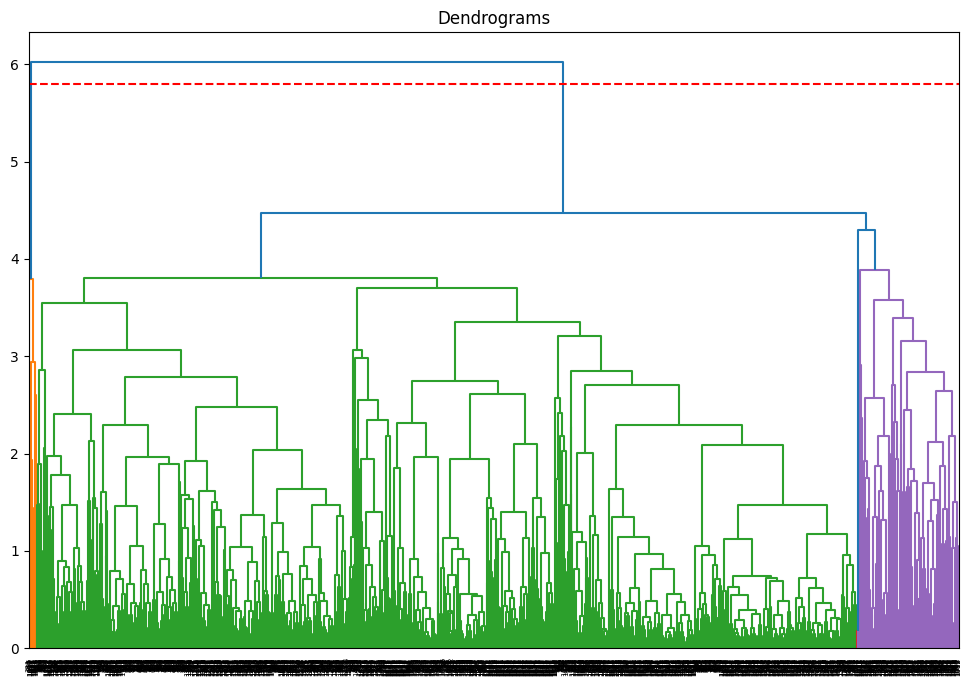

In [147]:
plt.rcParams['figure.figsize'] = [12, 8]  
plt.title("Dendrograms")
dendrogram_av = shc.dendrogram(shc.linkage( Customer_Data_PCA, method='average'))
plt.axhline(y=6-Best_dist, color='r', linestyle='--')

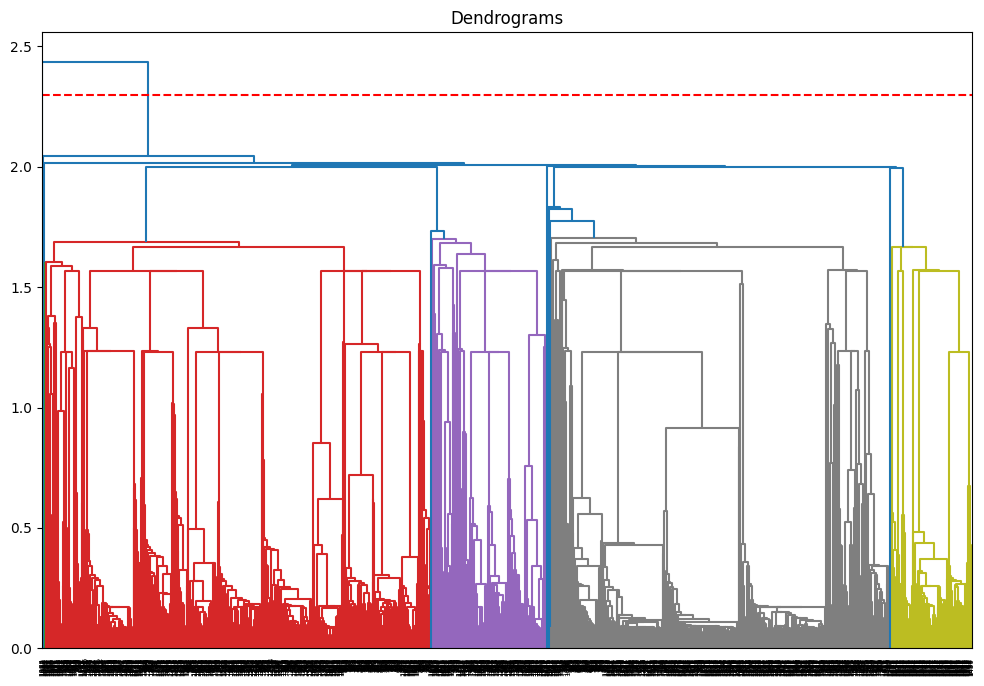

In [150]:
plt.rcParams['figure.figsize'] = [12, 8]  
plt.title("Dendrograms")
dendrogram_av = shc.dendrogram(shc.linkage( Customer_Data_PCA, method='single'))
plt.axhline(y=2.5-Best_dist, color='r', linestyle='--')

DBSCAN

Epsilon = 1.2000000000000002 Min_samples = 5 Score= 0.42256068326179


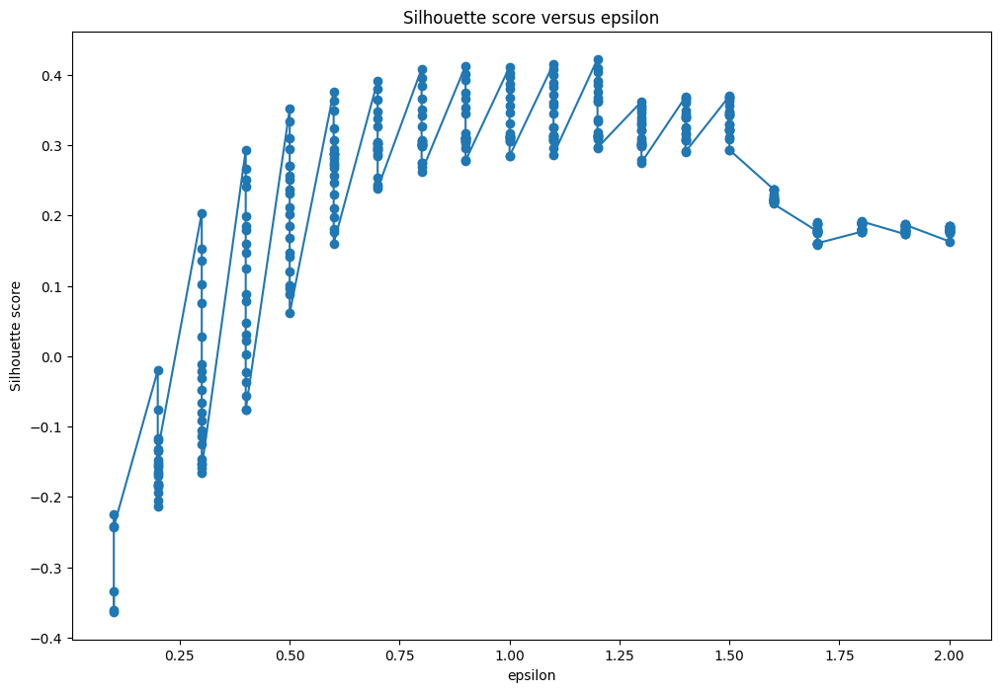

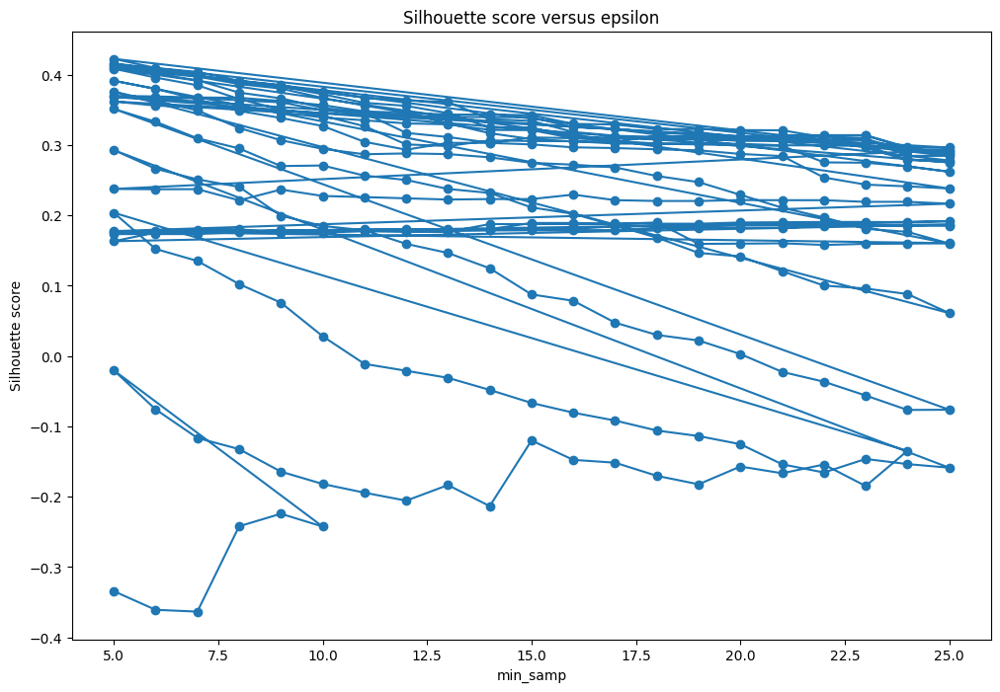

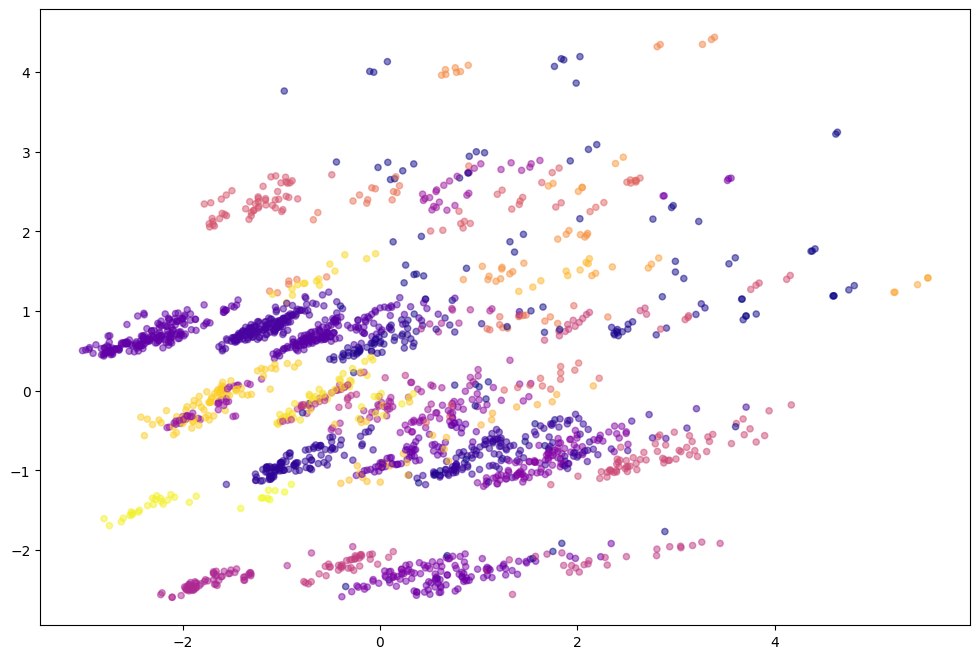

In [151]:
def display_cluster(X,km=[]):
    plt.scatter(X[:, 0], X[:,1], c = km.labels_, cmap= "plasma",alpha = 0.5,s = 20)
            
score=[]
epsilon=[]
clusters=[]
min_samp=[]

for e in np.arange(0.1, 3.1, 0.1):
    for mini in range(5,26):
        dbscan = DBSCAN(eps =e, min_samples = mini)
        dbscan=dbscan.fit(Customer_Data_PCA)
        Number_of_clusters=len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
        if Number_of_clusters > 1:
            epsilon.append(e)
            clusters.append(Number_of_clusters)
            min_samp.append(mini)
            score.append(metrics.silhouette_score(Customer_Data_PCA, dbscan.labels_))
            
plt.figure(1)  
plt.rcParams['figure.figsize'] = [12, 8]     
plt.plot(epsilon, score, marker='o')
plt.title('Silhouette score versus epsilon')
plt.xlabel('epsilon')
plt.ylabel('Silhouette score')

plt.figure(2)       
plt.plot(min_samp, score, marker='o')
plt.title('Silhouette score versus epsilon')
plt.xlabel('min_samp')
plt.ylabel('Silhouette score')

plt.figure(3) 

best_score=max(score)
g=score.index(best_score)
display_cluster(Customer_Data_PCA.to_numpy(),DBSCAN(eps =epsilon[g], min_samples = min_samp[g]).fit(Customer_Data_PCA))
Best_score_parameters='Epsilon = '+str(epsilon[g])+' Min_samples = '+str(min_samp[g])
print(Best_score_parameters+' Score= '+str(best_score))

GMM

<Figure size 1200x800 with 0 Axes>

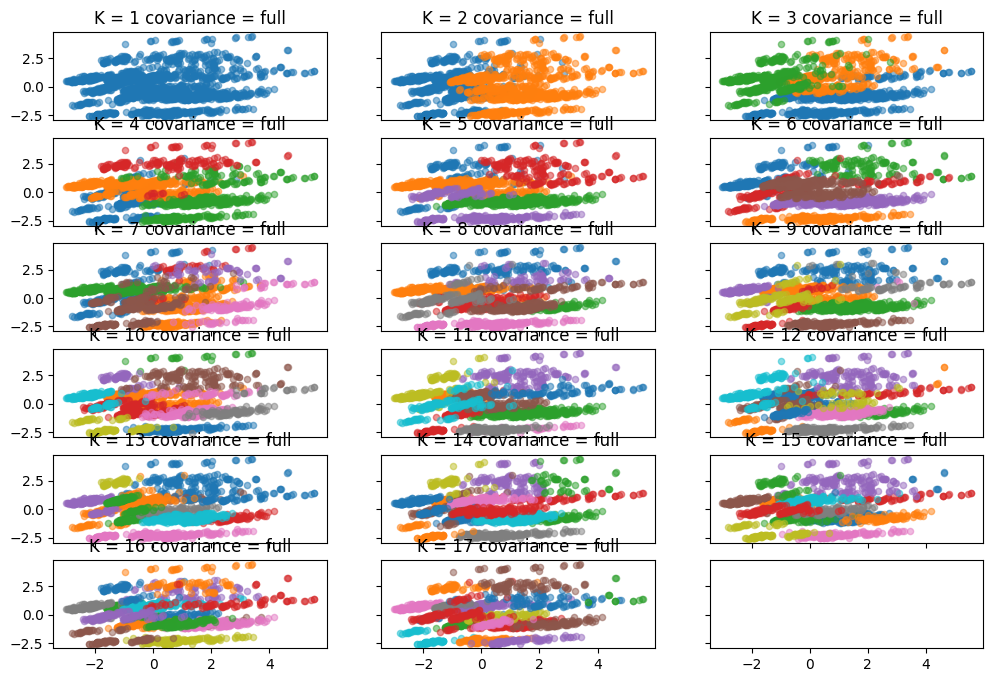

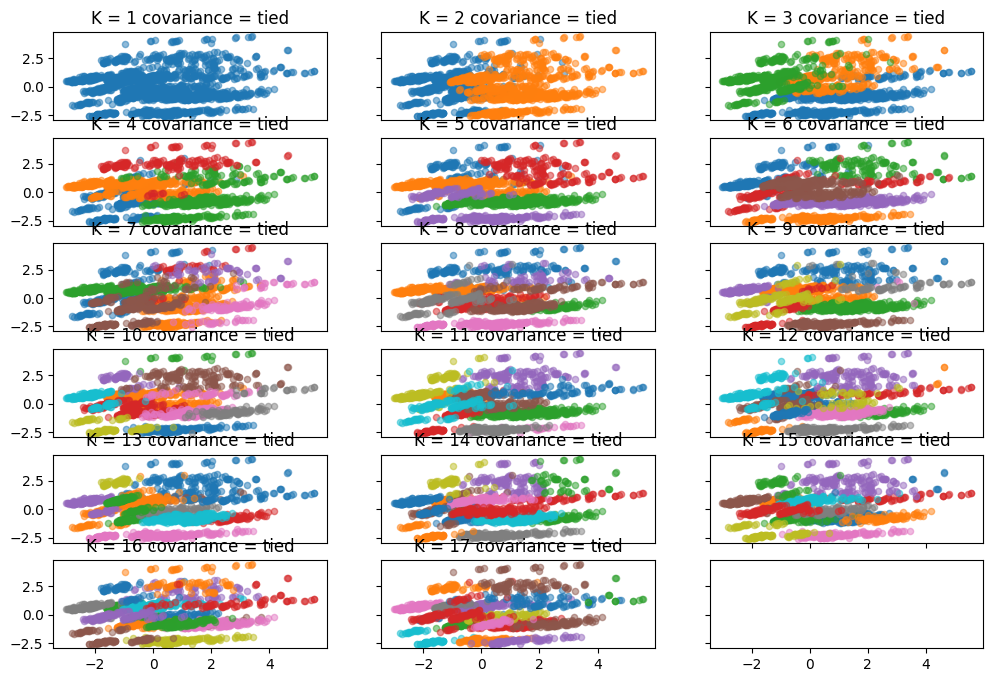

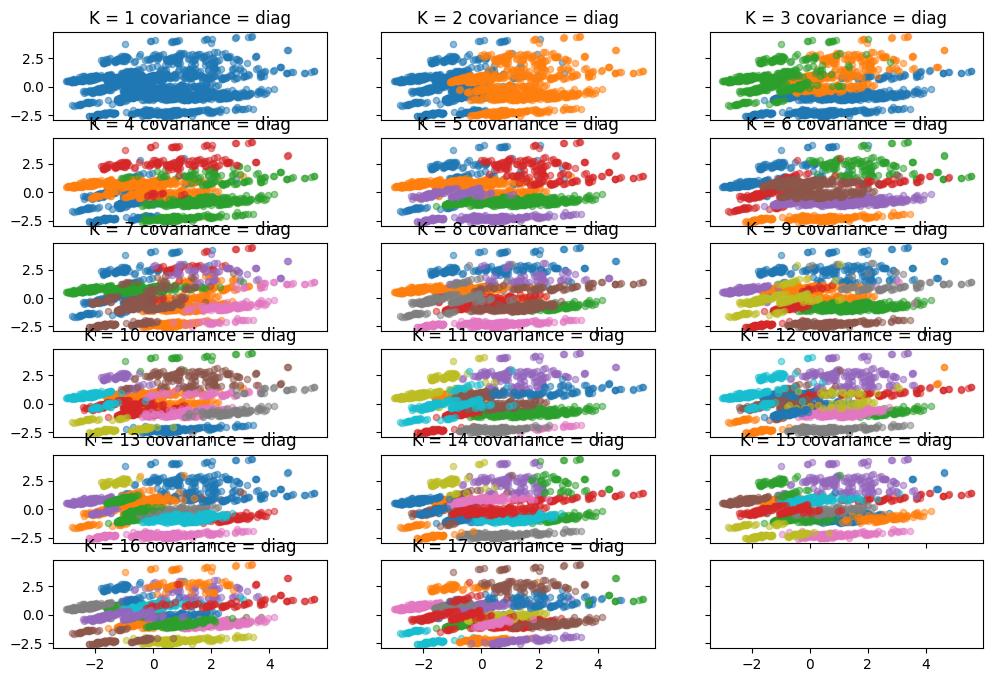

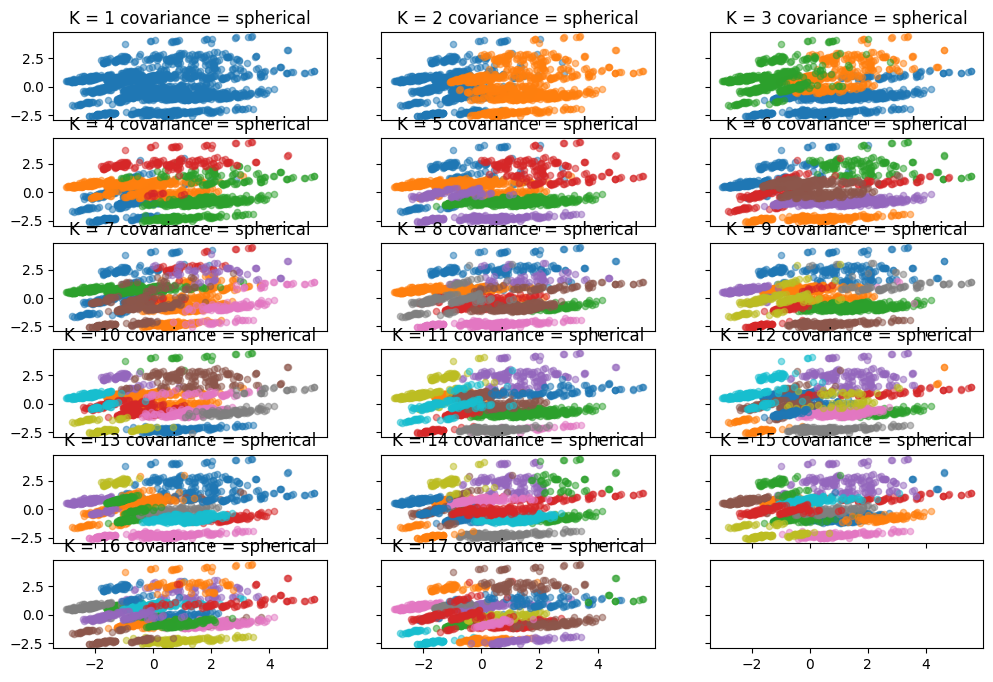

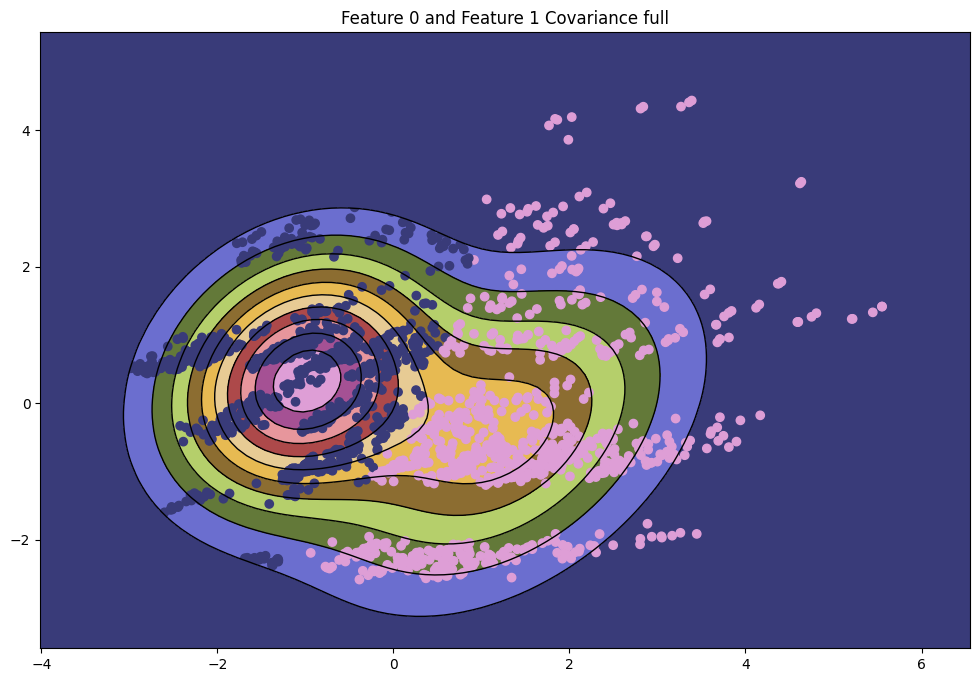

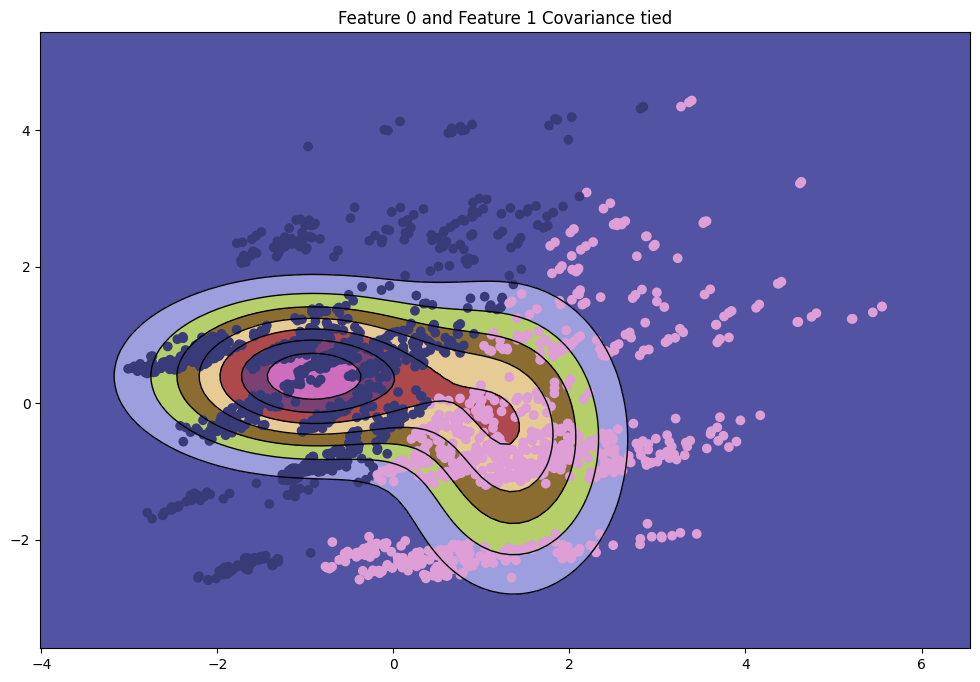

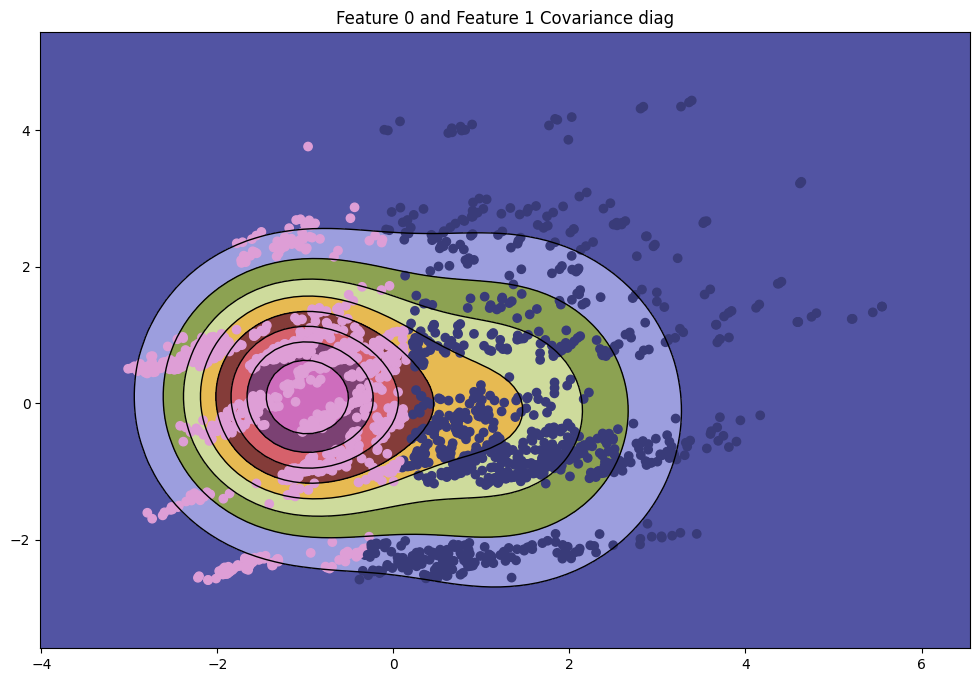

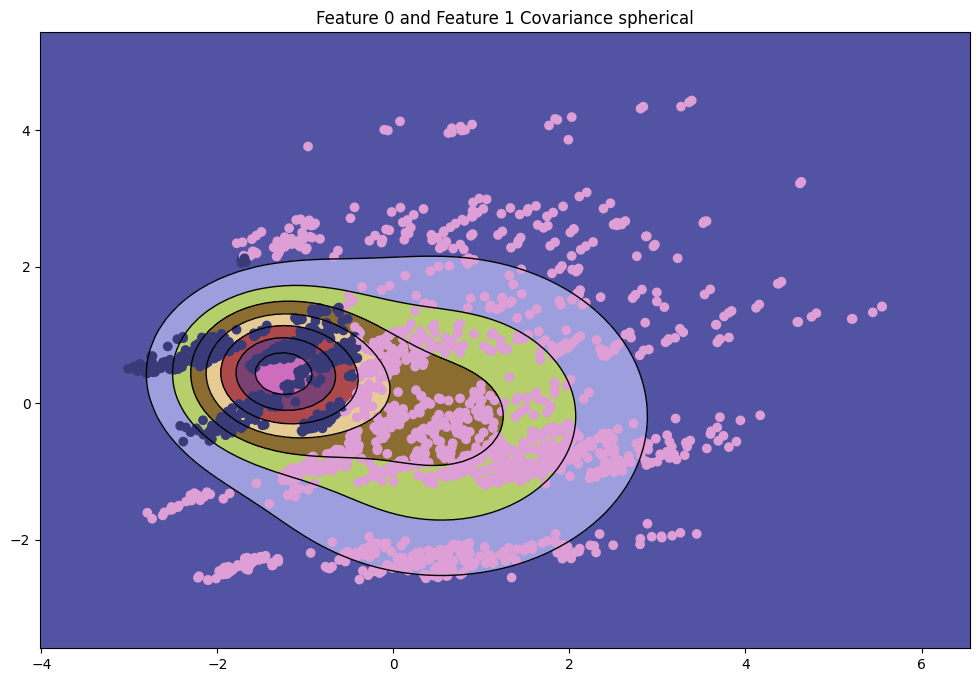

In [156]:
def plot_contours():
    covariance =['full', 'tied', 'diag', 'spherical']
    h=0
    for q in range(0,4):

        Customer_Data_PCA_2=Customer_Data_PCA.iloc[:,[0,1]].values
        gmm=GaussianMixture(n_components = 2,covariance_type=covariance[q])
        gmm=gmm.fit(Customer_Data_PCA_2)

        plt.figure(h+5)
        x_min, x_max = Customer_Data_PCA_2[:, 0].min() - 1, Customer_Data_PCA_2[:, 0].max() + 1
        y_min, y_max = Customer_Data_PCA_2[:, 1].min() - 1, Customer_Data_PCA_2[:, 1].max() + 1
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        Z = np.zeros((xx.shape[0], xx.shape[1]))
        for i in range(gmm.n_components):
            density = multivariate_normal(mean=gmm.means_[i], cov=gmm.covariances_[i]).pdf(np.dstack((xx, yy)))
            Z += density * gmm.weights_[i]

        plt.contour(xx, yy, Z, levels=10, linewidths=1, colors='black')
        plt.contourf(xx, yy, Z, levels=10, cmap='tab20b')
        plt.scatter(Customer_Data_PCA_2[:, 0], Customer_Data_PCA_2[:, 1], c=gmm.predict(Customer_Data_PCA_2), cmap='tab20b')
        plt.title('Feature 0 and Feature 1 Covariance '+covariance[q])
        plt.show()
        h=h+1

def display_cluster(axes,k,z,covariance,labels,X,km=[],num_clusters=0):
    color = 'brgcmyk'
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            axes[k][z].scatter(X[labels==i][0], X[labels==i][1],cmap = 'plasma',alpha = alpha,s=s)
            axes[k][z].title.set_text('K = '+str(i+1)+' covariance = '+covariance)

            
covariance =['full', 'tied', 'diag', 'spherical']
labels = []
gmm=[]
for q in range(0,4):

    for j in range(1,18):

        gmm.append(GaussianMixture(n_components = j,covariance_type=covariance[q]))
        gmm[j-1]=gmm[j-1].fit(Customer_Data_PCA)
        labels.append(gmm[j-1].predict(Customer_Data_PCA))

    k=0
    z=0

    f = plt.figure(q)
    f, axes = plt.subplots(nrows = 6, ncols = 3, sharex=True, sharey = True)
    plt.rcParams['figure.figsize'] = [12, 8]

    for j in range(1,18):

        display_cluster(axes,k,z,covariance[q],labels[j-1],Customer_Data_PCA,gmm[j-1],num_clusters=j)

        if j % 3==0:
            k=k+1
            z=0
        else:
            z=z+1
        

    k=0
    z=0
plot_contours()